# Goal is to maintain continuous derivatives in EOS
## - loop through eos to store all values
## - if value is discontinuous, take average of previous and following datapoint
## - t goes up to 181.9

### change EOS derivatives for T = 0.105
### take np.abs() for - derivatives close to 0
### loop over existing temps from logtemp and ye from ye

# Questions
## - what should the behavior of each variable look like?
## - 

In [1]:
import matplotlib.pyplot as plt
import numpy as np
#from kuibit import timeseries as ts
#from kuibit import unitconv as uc
#from kuibit.simdir import SimDir
from matplotlib import rc
import scipy.constants as const
import scipy.integrate as integrate
from scipy.optimize import root as root
from scipy.special import sph_harm
import matplotlib
from matplotlib import rcParams
import pylab
import os
from scipy.interpolate import griddata
import h5py
from ConstantsAndConversions import *
from collections import OrderedDict
import scipy as sp
import os

%matplotlib inline

import numpy.ma as ma
#import cmasher as cmr
from matplotlib.pyplot import figure

rcParams.update({'figure.autolayout': True})
#matplotlib.rc('text', usetex = True)
matplotlib.rc('font', **{'family': 'serif', 'serif':['Computer Modern'], 'size':11})
matplotlib.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]
matplotlib.rcParams['xtick.minor.size'] = 1
matplotlib.rcParams['xtick.minor.width'] = 1
matplotlib.rcParams['xtick.labelsize'] = 20
matplotlib.rcParams['ytick.labelsize'] = 20
matplotlib.rc('legend', fontsize=20)

%matplotlib inline

/var/folders/nr/rbr3ndbn343d7__44zxt3v780000gn/T/ipykernel_73686/3940887045.py:31: MatplotlibDeprecationWarning: Support for setting the 'text.latex.preamble' or 'pgf.preamble' rcParam to a list of strings is deprecated since 3.3 and will be removed two minor releases later; set it to a single string instead.
  matplotlib.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]


In [2]:
def shorten_str(s,max_len=10):
    """Shorten string
    Shorten a string to make it easier to read when printed
    Args:
        s (str): string. Original text to be shortened
        max_len (int): integer. Maximum length of the string to return. Default = 10
    Returns:
        str: shortened string
    """
    if len(s) <= max_len:
        return s
    else:
        l = (max_len-3)//2
        return s[:l] + '...' + s[-1*l:]

def shorten_path(path,max_len=10):
    """ Shorten path string
    Shorten a path string to make it easier to read when printed
    Args:
        path (str): string. Original path to be shortened
        max_len (int): integer. Maximum length of each dir to return. Default = 10
    Returns:
        str: shortened path
    """
    components = path.split('/')
    filename = components[-1]
    dirs = components[:-1]
    if len(dirs) > 2:
        dirs = [dirs[0],'...',dirs[-1]]
    s = ''
    for dir in dirs:
        s = s + shorten_str(dir,max_len=max_len) + '/'
    s = s + shorten_str(filename,max_len=max_len)
    return s


def plot_EOS(filenames, ye, T=0.1,verbose=False, beta=False):
    """Plot equation of state
    Plot the equation of state described by various .h5 files in the stellarcollapse format
    Args:
        filenames (array): list or array of strings. These are the paths to .h5 files to be plotted
        T (float): Temperature to plot at in MeV. Default = 0.1
        verbose (bool): Switch to turn on print statements during run
    Returns:
        plt.Figure: Figure to be plotted
        cs2: list of cs2 plotted
    """
    #make a figure of size 15,10 with 2 rows and 3 columns
    plt.style.use('seaborn-colorblind')

    fig, ax= plt.subplots(nrows=3, ncols=4,figsize=(11,7), tight_layout=True)
    #define the subplot for this figure, we are only doing one subplot for now
    #set the value of the line width and font size
    universal_linewidth=2
    universal_fontsize=11
    
    fig.suptitle(f"EOS Variables wrt restmass density for T={T} and Ye={ye}")
    if isinstance(filenames, str):
        filenames = [filenames]
    for filename_CO in filenames:
        f2 = h5py.File(filename_CO, 'r')

        keys2 = list(f2.keys())
        possible_varnames=['Abar','Xa','Xh','Xn','Xp','Zbar','cs2','dedt','dpderho','dpdrhoe','energy_shift','entropy',
                    'gamma','logenergy','logpress','logrho','logtemp','mu_e','mu_n','mu_p','muhat','munu',
                   'pointsrho','pointstemp','pointsye','ye']


        
        CO_EOS=[]
        for i in range(0, len(keys2)):
            if verbose:
                print("%d: %s" %(i, keys2[i]))
            CO_EOS.append(np.array(f2.get(keys2[i])))
        
        #Get the closest entry in the temperature that corresponds to 0.1 MeV
        T_target=T
        Ye_target=ye

        Tcold_index_CO=list(np.abs(10.**CO_EOS[keys2.index('logtemp')]-T_target)).index(np.min(np.abs(10.**CO_EOS[keys2.index('logtemp')] - T_target)))
        Ye_index_CO=list(np.abs(CO_EOS[keys2.index('ye')]-Ye_target)).index(np.min(np.abs(CO_EOS[keys2.index('ye')] - Ye_target)))
        print(np.abs(CO_EOS[keys2.index('ye')]-Ye_target))

        if verbose:
            print('Temp Index: ',Tcold_index_CO, '\nTempurature: ', 10.**CO_EOS[keys2.index('logtemp')][Tcold_index_CO])

        # ye_all = CO_EOS[keys2.index('ye')]
        logRho_CO=[]
        Yebeta_CO=[]
        logPressbeta_CO=[]
        logEnergybeta_CO=[]
        dedt_CO=[]
        dpderho_CO=[]
        dpdrhoe_CO=[]
        mu_e_CO=[]
        mu_n_CO=[]
        mu_p_CO=[]
        entropy_CO=[]
        cs2_CO=[]


        for rho_index in range(0, len(CO_EOS[keys2.index('logrho')])):
            #at each value of the rest mass density, calculate mu_beta as the absolute value of mu_n - mu_p - mu_e = 0
            #find the closest value of mu_beta to zero (minimum), and get its index
            mu_betaCO = list(np.abs(CO_EOS[keys2.index('mu_n')][:,Tcold_index_CO,rho_index] - CO_EOS[keys2.index('mu_p')][:,Tcold_index_CO,rho_index] - CO_EOS[keys2.index('mu_e')][:,Tcold_index_CO,rho_index]))

            #beta-equilibrium corresponds to the closest value of mu_beta to zero, find the index
            if beta:
                Ye_index_CO = list(mu_betaCO).index(np.min(mu_betaCO))
            
            #print(CO_EOS[keys2.index('logrho')][rho_index], np.min(mu_betaCO), Yebeta_index_CO)
        
            #keep the current value of rho, the value of Ye that corresponds to beta-equilibrium,
            #and the Pressure at this rho and Ye (temperature has been fixed to 0.1 MeV)
            #do the same for the energy density
            logRho_CO.append(CO_EOS[keys2.index('logrho')][rho_index])
            Yebeta_CO.append(CO_EOS[keys2.index('ye')][Ye_index_CO])
            logPressbeta_CO.append(CO_EOS[keys2.index('logpress')][Ye_index_CO][Tcold_index_CO][rho_index])
            logEnergybeta_CO.append(CO_EOS[keys2.index('logenergy')][Ye_index_CO][Tcold_index_CO][rho_index])
            dedt_CO.append(CO_EOS[keys2.index('dedt')][Ye_index_CO][Tcold_index_CO][rho_index])
            dpderho_CO.append(CO_EOS[keys2.index('dpderho')][Ye_index_CO][Tcold_index_CO][rho_index])
            dpdrhoe_CO.append(CO_EOS[keys2.index('dpdrhoe')][Ye_index_CO][Tcold_index_CO][rho_index])
            mu_e_CO.append(CO_EOS[keys2.index('mu_e')][Ye_index_CO][Tcold_index_CO][rho_index])
            mu_n_CO.append(CO_EOS[keys2.index('mu_n')][Ye_index_CO][Tcold_index_CO][rho_index])
            mu_p_CO.append(CO_EOS[keys2.index('mu_p')][Ye_index_CO][Tcold_index_CO][rho_index])
            entropy_CO.append(CO_EOS[keys2.index('entropy')][Ye_index_CO][Tcold_index_CO][rho_index])
            cs2_CO.append(CO_EOS[keys2.index('cs2')][Ye_index_CO][Tcold_index_CO][rho_index])
    
        #SECOND EOS PLOTS
        ax[0][0].plot(logRho_CO, Yebeta_CO)
        ax[0][1].plot(logRho_CO, logPressbeta_CO)
        ax[0][2].plot(logRho_CO, logEnergybeta_CO)
        ax[0][3].plot(logRho_CO, dedt_CO)
        ax[1][0].plot(logRho_CO, dpderho_CO)
        ax[1][1].plot(logRho_CO, dpdrhoe_CO)
        ax[1][2].plot(logRho_CO, mu_e_CO)
        ax[1][3].plot(logRho_CO, mu_n_CO)
        ax[2][0].plot(logRho_CO, mu_p_CO)
        ax[2][1].plot(logRho_CO, entropy_CO)
        ax[2][2].plot(logRho_CO, cs2_CO,label=shorten_path(filename_CO,20))

    ax[0][0].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
    ax[0][0].set_ylabel(r'$Y_{e}^\beta$', fontsize=universal_fontsize)
    ax[0][1].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
    ax[0][1].set_ylabel(r'$\log(P \rm{ (dyn/cm^2)})$', fontsize=universal_fontsize)
    ax[0][2].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
    ax[0][2].set_ylabel(r'$\log(\epsilon \rm{ (erg/g)})$', fontsize=universal_fontsize)
    ax[0][3].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
    ax[0][3].set_ylabel(r'$dedt$', fontsize=universal_fontsize)
    ax[1][0].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
    ax[1][0].set_ylabel(r'$dpde\rho$', fontsize=universal_fontsize)
    ax[1][1].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
    ax[1][1].set_ylabel(r'$dpd\rho e$', fontsize=universal_fontsize)
    ax[1][2].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
    ax[1][2].set_ylabel(r'$\mu_e$', fontsize=universal_fontsize)
    ax[1][3].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
    ax[1][3].set_ylabel(r'$\mu_n$', fontsize=universal_fontsize)
    ax[2][0].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
    ax[2][0].set_ylabel(r'$\mu_p$', fontsize=universal_fontsize)
    ax[2][1].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
    ax[2][1].set_ylabel(r'$S_{entropy}$', fontsize=universal_fontsize)
    ax[2][2].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
    ax[2][2].set_ylabel(r'$c^2$', fontsize=universal_fontsize)
    ax[2][3].axis('off')

    handles, labels = ax[2][2].get_legend_handles_labels()

    ax[2][3].legend(handles, labels, prop=dict(size=universal_fontsize))


    return fig, logRho_CO, dpderho_CO, dpdrhoe_CO, cs2_CO


[0.004   0.00538 0.01476 0.02414 0.03352 0.0429  0.05228 0.06166 0.07104
 0.08042 0.0898  0.09918 0.10856 0.11794 0.12732 0.1367  0.14608 0.15546
 0.16484 0.17422 0.1836  0.19298 0.20236 0.21174 0.22112 0.2305  0.23988
 0.24926 0.25864 0.26802 0.2774  0.28678 0.29616 0.30554 0.31492 0.3243
 0.33368 0.34306 0.35244 0.36182 0.3712  0.38058 0.38996 0.39934 0.40872
 0.4181  0.42748 0.43686 0.44624 0.45562 0.465  ]
[0.         0.0105102  0.02102041 0.03153061 0.04204082 0.05255102
 0.06306122 0.07357143 0.08408163 0.09459184 0.10510204 0.11561224
 0.12612245 0.13663265 0.14714286 0.15765306 0.16816327 0.17867347
 0.18918367 0.19969388 0.21020408 0.22071429 0.23122449 0.24173469
 0.2522449  0.2627551  0.27326531 0.28377551 0.29428571 0.30479592
 0.31530612 0.32581633 0.33632653 0.34683673 0.35734694 0.36785714
 0.37836735 0.38887755 0.39938776 0.40989796 0.42040816 0.43091837
 0.44142857 0.45193878 0.46244898 0.47295918 0.48346939 0.49397959
 0.5044898  0.515     ]


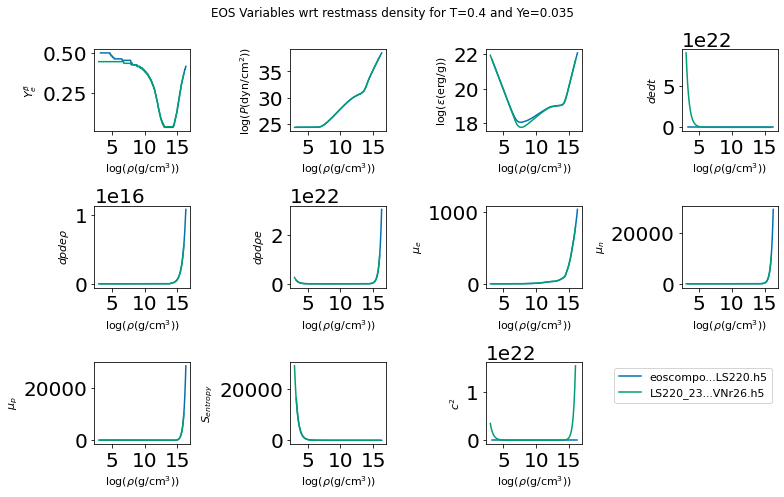

In [117]:
fig, logrho, dpderho, dpdrhoe, cs2 = plot_EOS(['eoscompose_converted1_LS220.h5','LS220_234r_136t_50y_analmu_20091212_SVNr26.h5'],ye=0.035, T=0.4,verbose=False, beta=True)

[0.      0.00938 0.01876 0.02814 0.03752 0.0469  0.05628 0.06566 0.07504
 0.08442 0.0938  0.10318 0.11256 0.12194 0.13132 0.1407  0.15008 0.15946
 0.16884 0.17822 0.1876  0.19698 0.20636 0.21574 0.22512 0.2345  0.24388
 0.25326 0.26264 0.27202 0.2814  0.29078 0.30016 0.30954 0.31892 0.3283
 0.33768 0.34706 0.35644 0.36582 0.3752  0.38458 0.39396 0.40334 0.41272
 0.4221  0.43148 0.44086 0.45024 0.45962 0.469  ]
[0.      0.00938 0.01876 0.02814 0.03752 0.0469  0.05628 0.06566 0.07504
 0.08442 0.0938  0.10318 0.11256 0.12194 0.13132 0.1407  0.15008 0.15946
 0.16884 0.17822 0.1876  0.19698 0.20636 0.21574 0.22512 0.2345  0.24388
 0.25326 0.26264 0.27202 0.2814  0.29078 0.30016 0.30954 0.31892 0.3283
 0.33768 0.34706 0.35644 0.36582 0.3752  0.38458 0.39396 0.40334 0.41272
 0.4221  0.43148 0.44086 0.45024 0.45962 0.469  ]
[0.      0.00938 0.01876 0.02814 0.03752 0.0469  0.05628 0.06566 0.07504
 0.08442 0.0938  0.10318 0.11256 0.12194 0.13132 0.1407  0.15008 0.15946
 0.16884 0.17822 0.1876  0

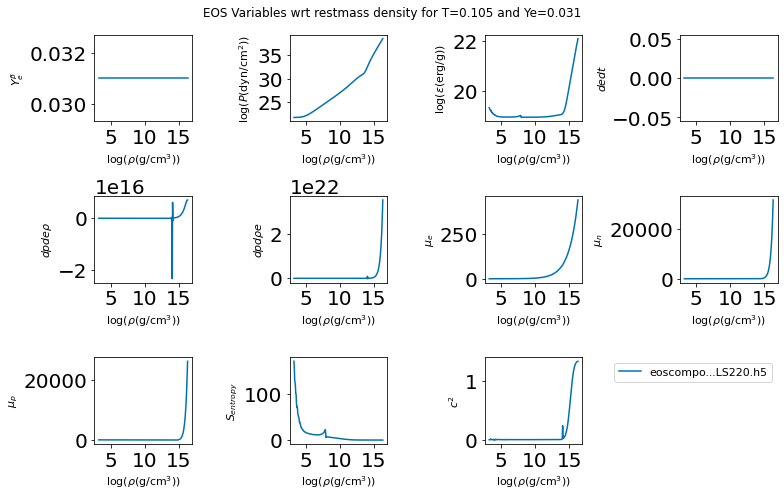

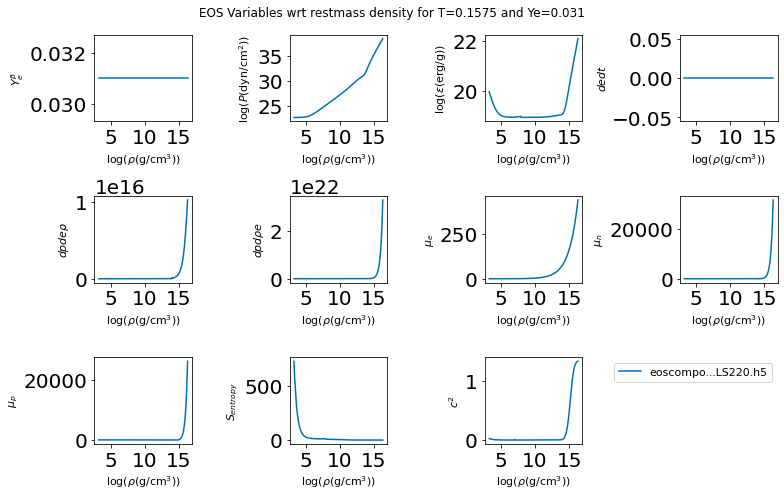

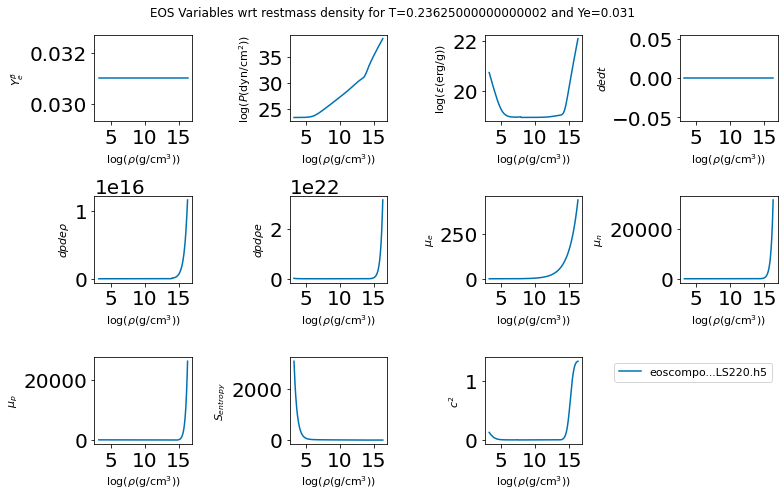

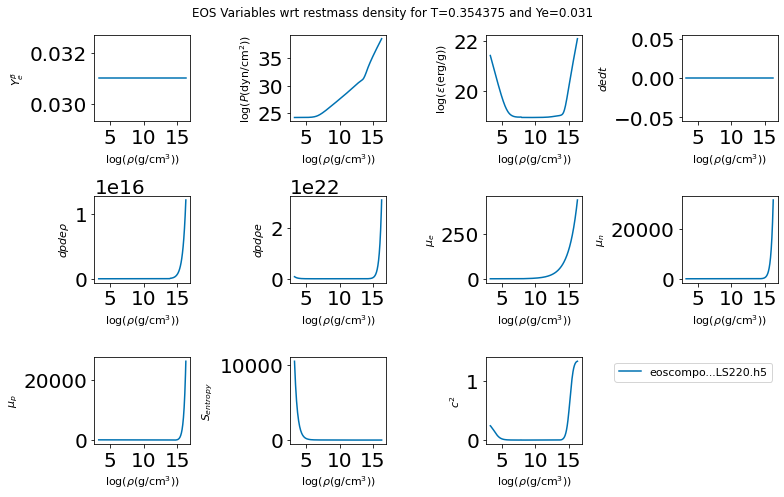

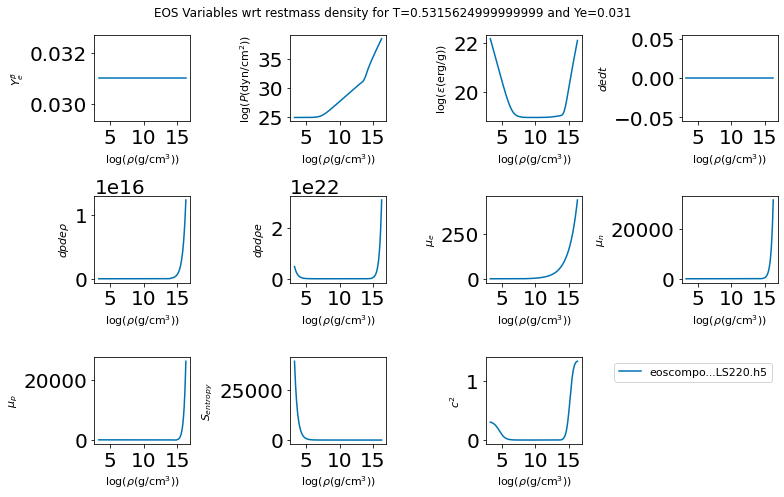

...

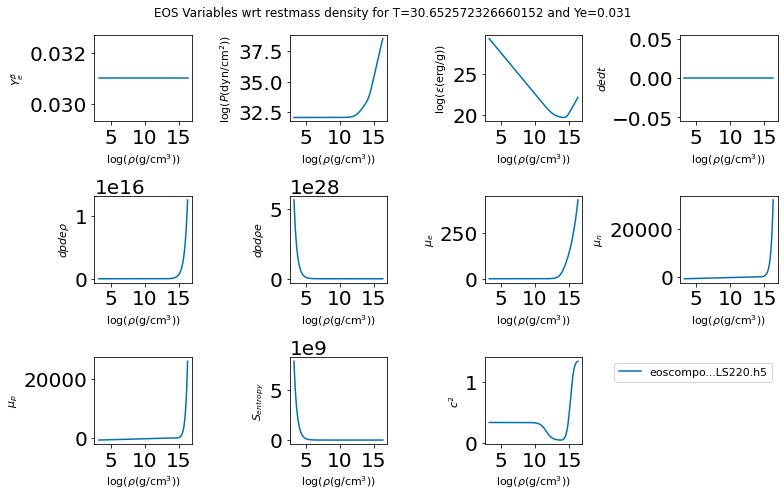

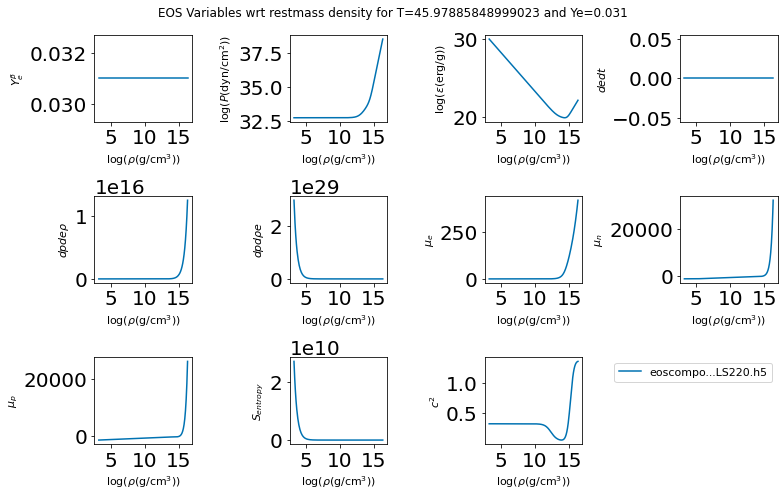

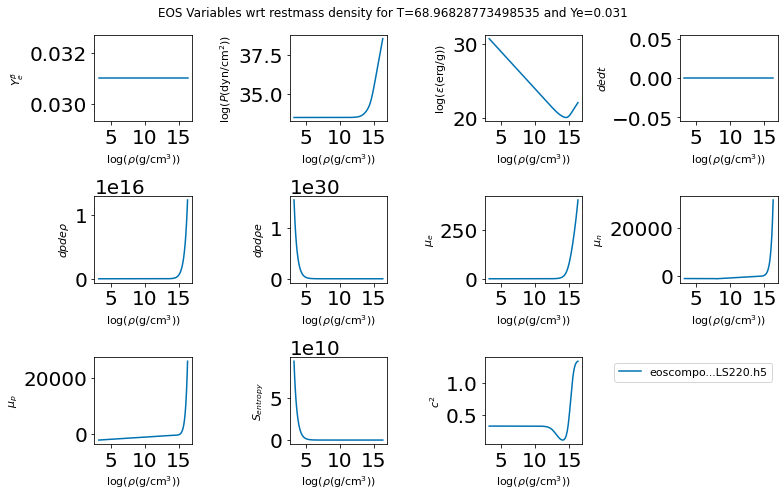

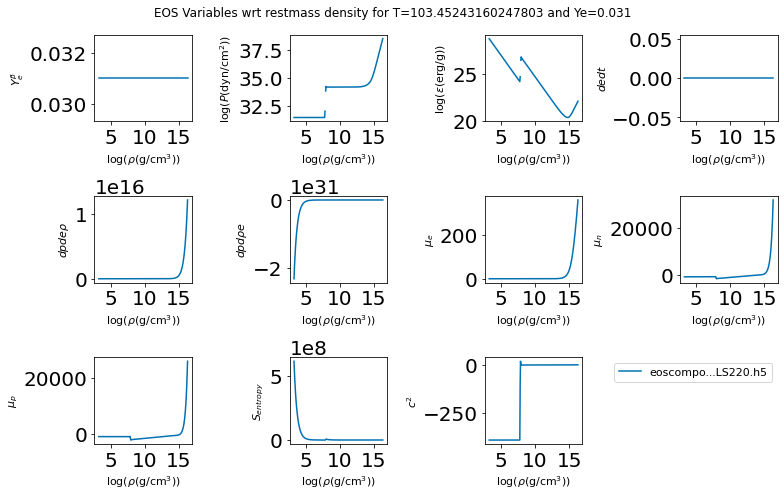

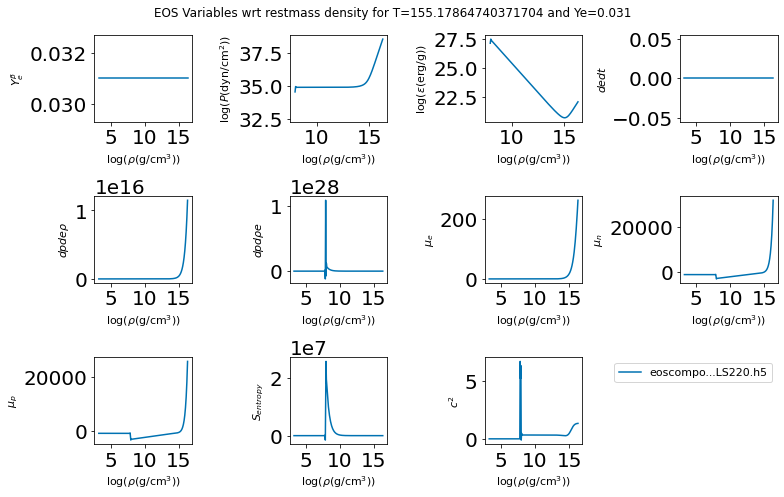

In [116]:
temp=0.105
ye=0.031

EOS_dict = {}

while ye<0.5:
    while temp<181.9:
        fig, logrho, dpderho, dpdrhoe, cs2 = plot_EOS(['eoscompose_converted1_LS220.h5'],ye=ye,T=temp,verbose=False)
        fig.savefig(str(ye)+' '+str(temp)+'.png')
        EOS_dict[str(ye)+' '+str(temp)] = fig
        temp *= 1.5
    ye *= 1.5
    

[0.      0.00938 0.01876 0.02814 0.03752 0.0469  0.05628 0.06566 0.07504
 0.08442 0.0938  0.10318 0.11256 0.12194 0.13132 0.1407  0.15008 0.15946
 0.16884 0.17822 0.1876  0.19698 0.20636 0.21574 0.22512 0.2345  0.24388
 0.25326 0.26264 0.27202 0.2814  0.29078 0.30016 0.30954 0.31892 0.3283
 0.33768 0.34706 0.35644 0.36582 0.3752  0.38458 0.39396 0.40334 0.41272
 0.4221  0.43148 0.44086 0.45024 0.45962 0.469  ]
[0.      0.00938 0.01876 0.02814 0.03752 0.0469  0.05628 0.06566 0.07504
 0.08442 0.0938  0.10318 0.11256 0.12194 0.13132 0.1407  0.15008 0.15946
 0.16884 0.17822 0.1876  0.19698 0.20636 0.21574 0.22512 0.2345  0.24388
 0.25326 0.26264 0.27202 0.2814  0.29078 0.30016 0.30954 0.31892 0.3283
 0.33768 0.34706 0.35644 0.36582 0.3752  0.38458 0.39396 0.40334 0.41272
 0.4221  0.43148 0.44086 0.45024 0.45962 0.469  ]
[0.      0.00938 0.01876 0.02814 0.03752 0.0469  0.05628 0.06566 0.07504
 0.08442 0.0938  0.10318 0.11256 0.12194 0.13132 0.1407  0.15008 0.15946
 0.16884 0.17822 0.1876  0

/var/folders/nr/rbr3ndbn343d7__44zxt3v780000gn/T/ipykernel_41215/18207072.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax= plt.subplots(nrows=3, ncols=4,figsize=(11,7), tight_layout=True)


[0.      0.00938 0.01876 0.02814 0.03752 0.0469  0.05628 0.06566 0.07504
 0.08442 0.0938  0.10318 0.11256 0.12194 0.13132 0.1407  0.15008 0.15946
 0.16884 0.17822 0.1876  0.19698 0.20636 0.21574 0.22512 0.2345  0.24388
 0.25326 0.26264 0.27202 0.2814  0.29078 0.30016 0.30954 0.31892 0.3283
 0.33768 0.34706 0.35644 0.36582 0.3752  0.38458 0.39396 0.40334 0.41272
 0.4221  0.43148 0.44086 0.45024 0.45962 0.469  ]
[0.      0.00938 0.01876 0.02814 0.03752 0.0469  0.05628 0.06566 0.07504
 0.08442 0.0938  0.10318 0.11256 0.12194 0.13132 0.1407  0.15008 0.15946
 0.16884 0.17822 0.1876  0.19698 0.20636 0.21574 0.22512 0.2345  0.24388
 0.25326 0.26264 0.27202 0.2814  0.29078 0.30016 0.30954 0.31892 0.3283
 0.33768 0.34706 0.35644 0.36582 0.3752  0.38458 0.39396 0.40334 0.41272
 0.4221  0.43148 0.44086 0.45024 0.45962 0.469  ]
[0.      0.00938 0.01876 0.02814 0.03752 0.0469  0.05628 0.06566 0.07504
 0.08442 0.0938  0.10318 0.11256 0.12194 0.13132 0.1407  0.15008 0.15946
 0.16884 0.17822 0.1876  0

'LS220_234r_136t_50y_analmu_20091212_SVNr26.h5'

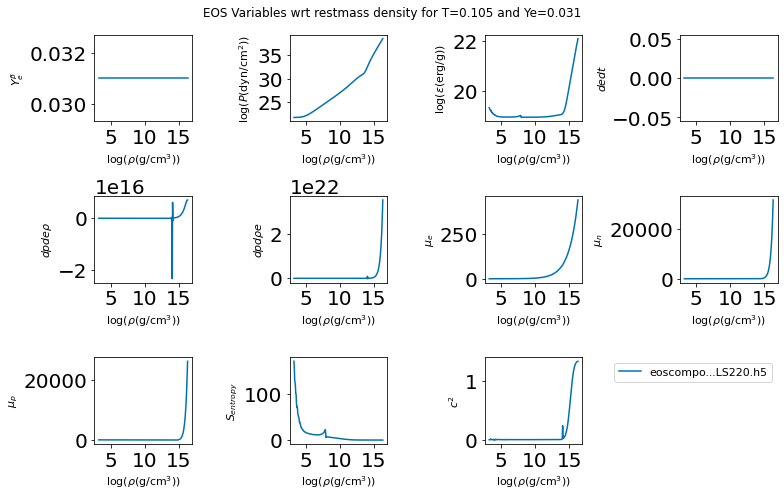

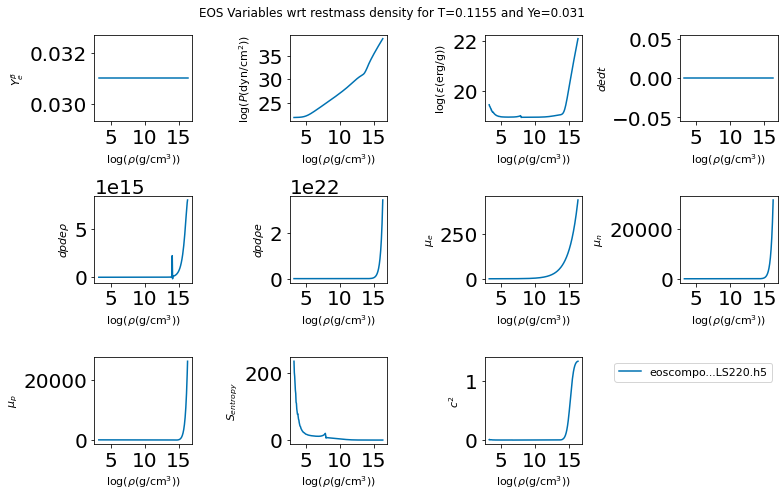

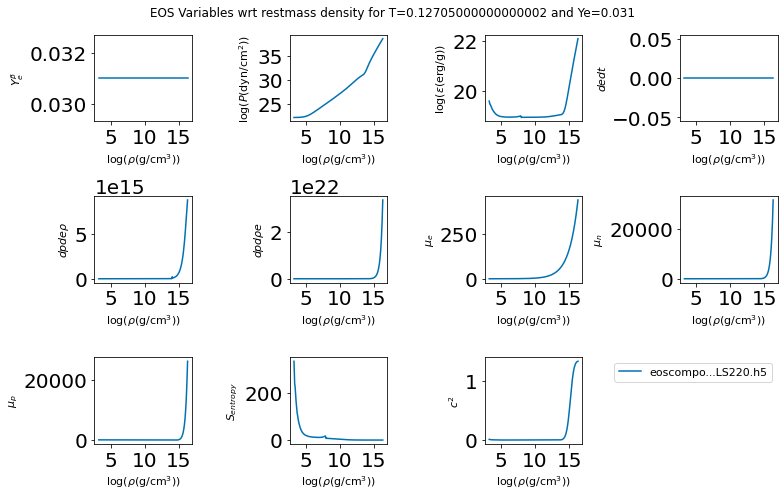

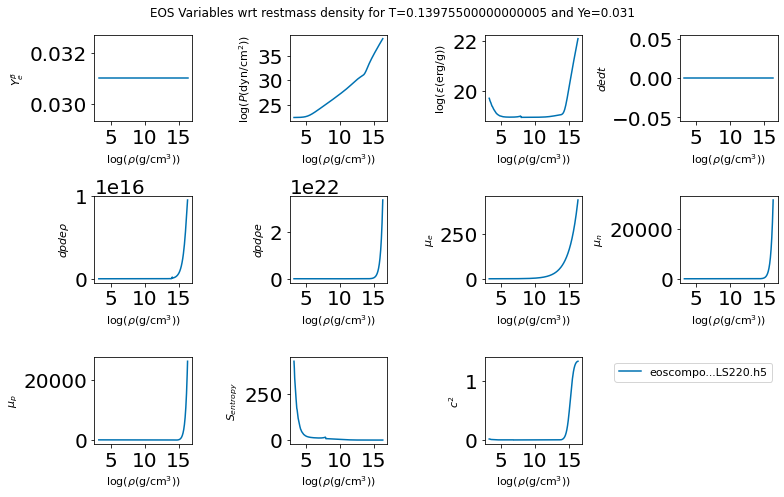

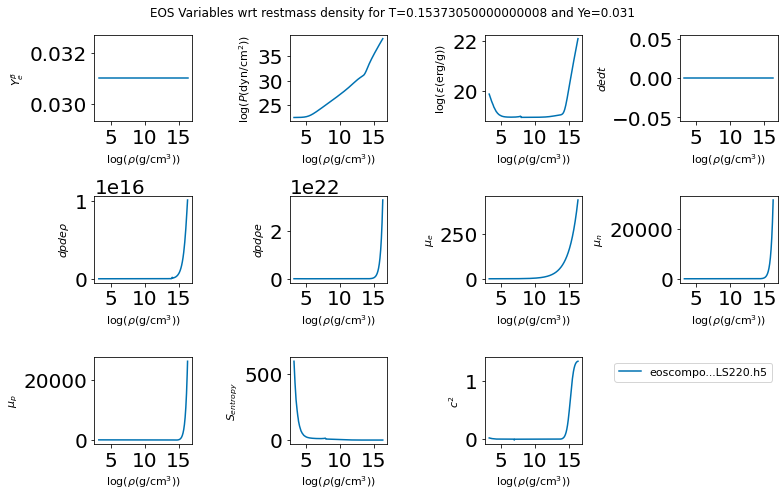

...

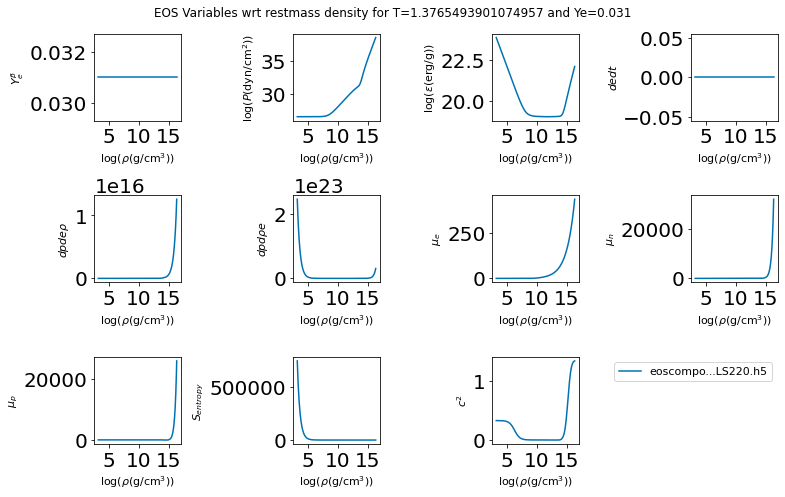

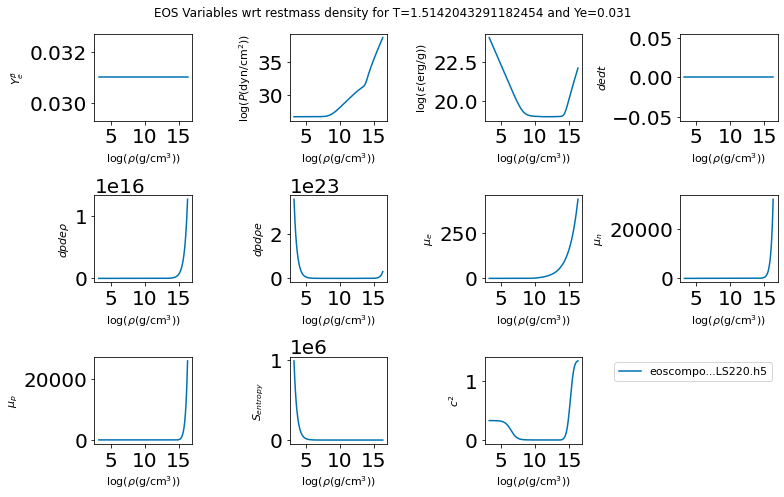

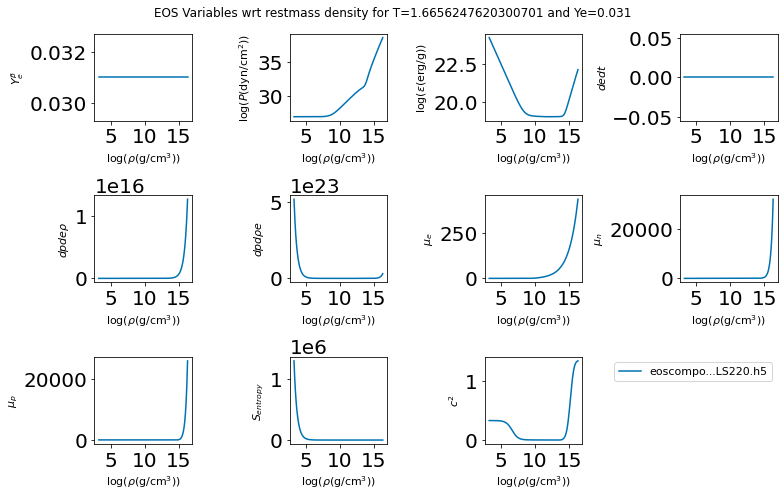

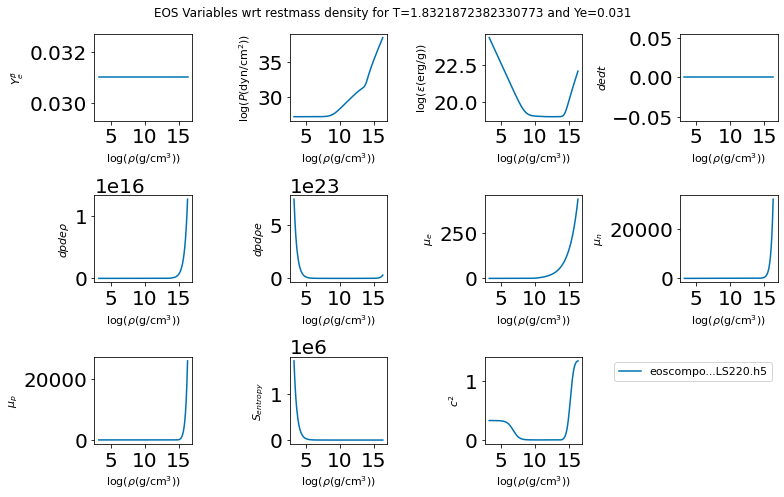

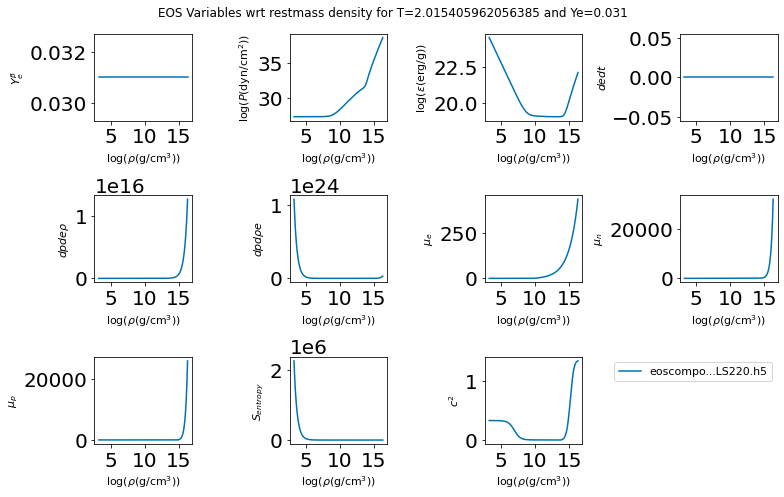

In [115]:
temp=0.105
ye=0.031

EOS_dict = {}

while ye<0.5:
    while temp<2.20:
        fig, logrho, dpderho, dpdrhoe, cs2 = plot_EOS(['eoscompose_converted1_LS220.h5'],ye=ye,T=temp,verbose=False)
        if  min(dpderho)<-0.1 or min(dpdrhoe)<-0.1:
            fig.savefig(str(ye)+' '+str(temp)+'2.png')
            EOS_dict[str(ye)+' '+str(temp)] = fig
        temp *= 1.1
    ye *= 1.5

LS220_SC = 'LS220_234r_136t_50y_analmu_20091212_SVNr26.h5'

0: Abar
1: Xa
2: Xh
3: Xn
4: Xp
5: Zbar
6: cs2
7: dedt
8: dpderho
9: dpdrhoe
10: energy_shift
11: entropy
12: gamma
13: logenergy
14: logpress
15: logrho
16: logtemp
17: mu_e
18: mu_n
19: mu_p
20: muhat
21: munu
22: pointsrho
23: pointstemp
24: pointsye
25: ye
Temp Index:  0 
Tempurature:  0.105


/var/folders/nr/rbr3ndbn343d7__44zxt3v780000gn/T/ipykernel_41215/1474794690.py:3: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


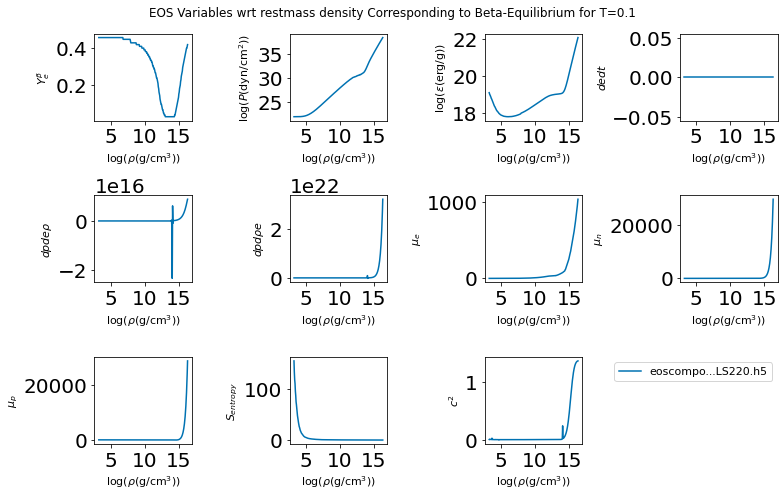

In [89]:
fig, logrho, dpderho, dpdrhoe, cs2 = plot_EOS(['eoscompose_converted1_LS220.h5'],T=0.1,verbose=True)

fig.show()

0: Abar
1: Xa
2: Xh
3: Xn
4: Xp
5: Zbar
6: cs2
7: dedt
8: dpderho
9: dpdrhoe
10: energy_shift
11: entropy
12: gamma
13: logenergy
14: logpress
15: logrho
16: logtemp
17: mu_e
18: mu_n
19: mu_p
20: muhat
21: munu
22: pointsrho
23: pointstemp
24: pointsye
25: ye
Temp Index:  49 
Tempurature:  1.0017952529571812


/var/folders/nr/rbr3ndbn343d7__44zxt3v780000gn/T/ipykernel_41215/3541309022.py:3: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig_1.show()


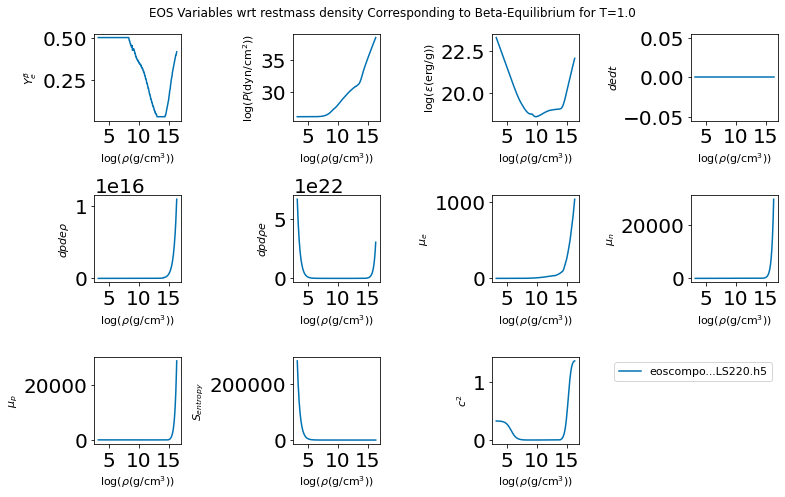

In [90]:
fig_1, logrho, dpderho_1, dpdrhoe_1, cs2 = plot_EOS(['eoscompose_converted1_LS220.h5'],T=1.0,verbose=True)

fig_1.show()

In [91]:
for i in dpderho:
    print(i)

269.3675271194246
1188.5684717682038
1093.3390670416356
660.7114028859487
1442.9861976015532
1078.1625380009327
1095.6764959966183
1704.4050531405455
18088.359396210722
1972.0715470249374
1317.7631879126163
4182.336862085823
6181.614649102623
1618.7670593989455
1690.4451323384378
2117.561803798812
3017.736430418791
2446.4737374751926
2503.3142521966747
25678.04859504743
9615.751080322749
2560.6524781469166
8208.026491564095
7744.966793508888
24984.53985239264
18736.555083420084
8578.679558747552
37243.36505305948
-564212.7894845048
14281.89359572266
14610.25757790851
14616.854931283384
19355.485028370087
21917.027422820887
60373.427148163835
20973.75879539733
39388.715414964165
-80466.3822528248
75428.58527631419
53575.83159584716
115232.37323089129
135072.2391328086
73736.4040344648
84752.17069727606
124965.86085585797
262634.71646832745
134234.67559690637
192105.45103594565
203767.94625976667
180602.67969980405
318633.8173432743
296501.0633462199
454341.18877488637
314326.8678318019


In [92]:
neg_index=[dpderho.index(i)for i in dpderho if i<0]

In [93]:
print(neg_index)


[28, 37, 208, 210, 211, 213]


In [86]:
for i,l in enumerate(dpderho):
    if l<0:
        try:
            print(l)
            dpderho[i] = np.average([dpderho[i-1],dpderho[i+1]])
            print(dpderho[i])
    

SyntaxError: unexpected EOF while parsing (1450892718.py, line 7)

[0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1.  1.1 1.2 1.3 1.4 1.5 1.6 1.7 1.8 1.9
 2.  2.1]
0 0.2
1 0.3
2 0.4
3 0.5
4 0.6
5 0.7
6 0.8
7 0.9
8 1.0
9 1.1
10 1.2
11 1.3
12 1.4
13 1.5
14 1.6
15 1.7
16 1.8
17 1.9
18 2.0
19 2.1
[[<Figure size 792x504 with 12 Axes>, [3.265381567728317, 3.3164958982233532, 3.36761022871839, 3.4187245592134263, 3.469838889708463, 3.5209532202034994, 3.5720675506985358, 3.623181881193572, 3.674296211688609, 3.725410542183645, 3.776524872678682, 3.8276392031737183, 3.878753533668755, 3.9298678641637914, 3.9809821946588277, 4.0320965251538645, 4.083210855648901, 4.134325186143937, 4.185439516638974, 4.236553847134011, 4.287668177629047, 4.338782508124083, 4.38989683861912, 4.441011169114156, 4.492125499609193, 4.54323983010423, 4.5943541605992655, 4.645468491094302, 4.696582821589339, 4.747697152084375, 4.798811482579412, 4.8499258130744485, 4.901040143569485, 4.952154474064521, 5.003268804559558, 5.054383135054595, 5.105497465549631, 5.156611796044667, 5.207726126539704, 

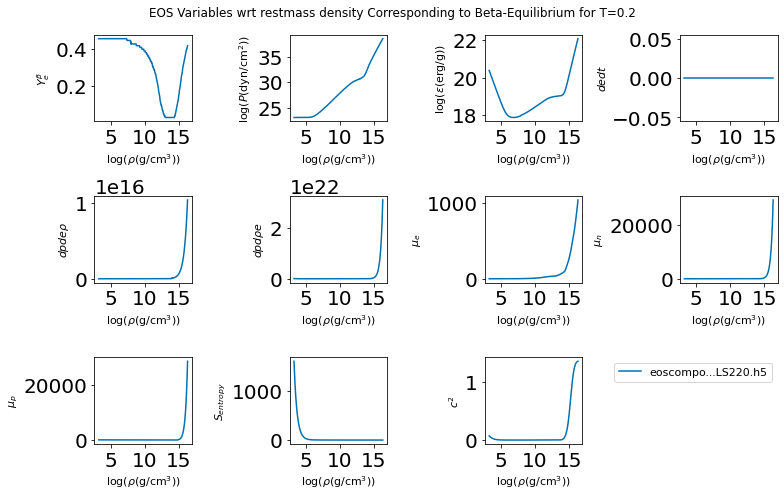

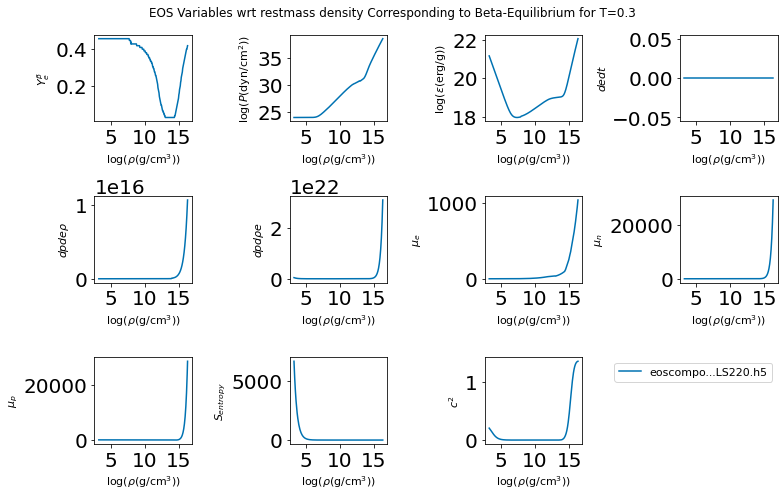

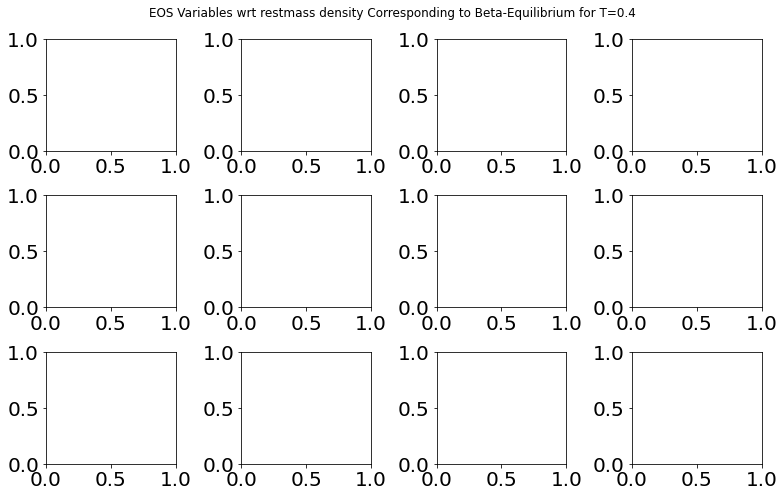

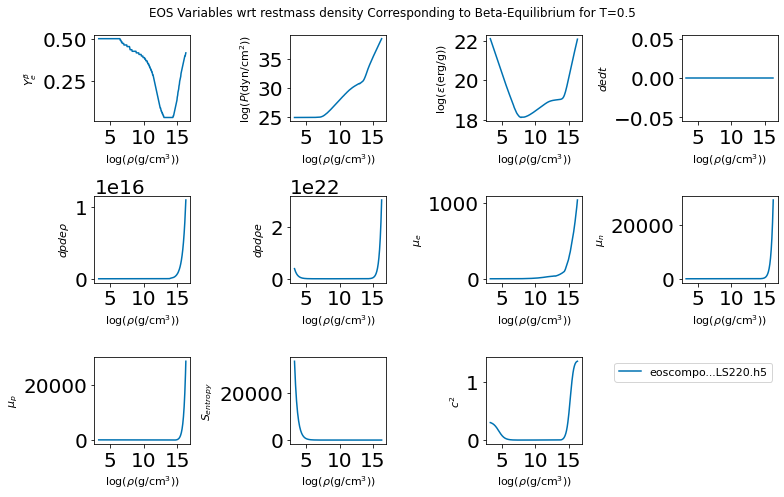

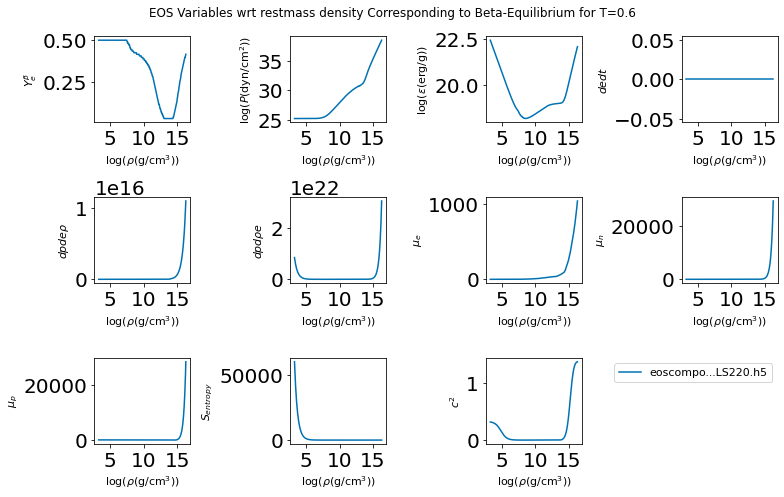

...

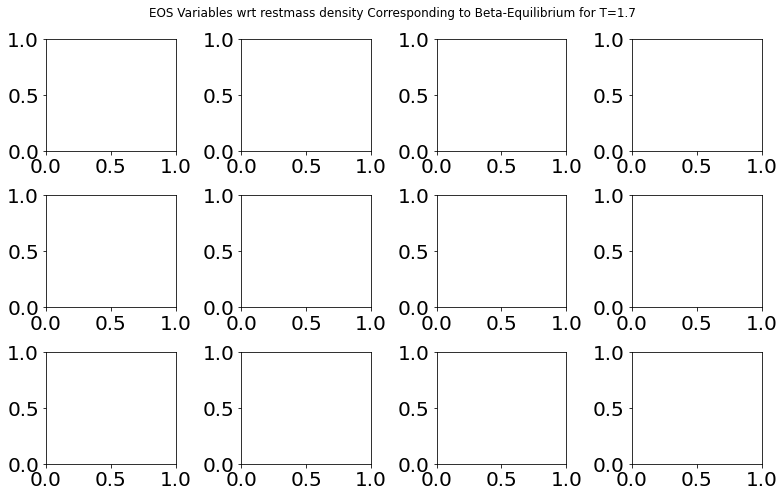

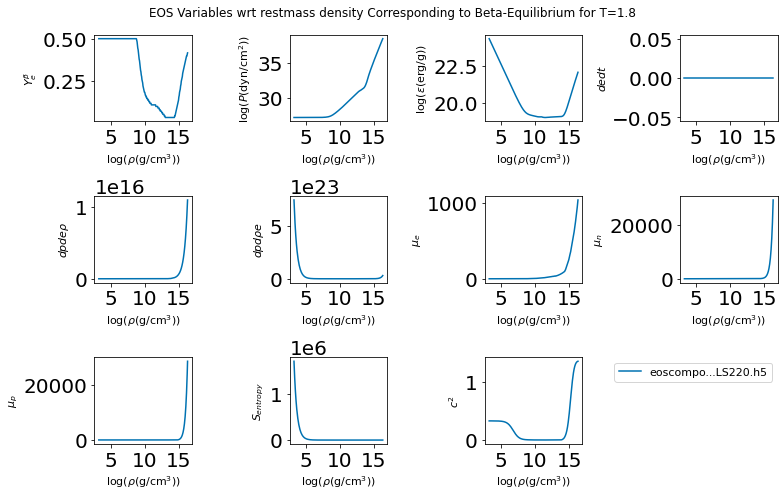

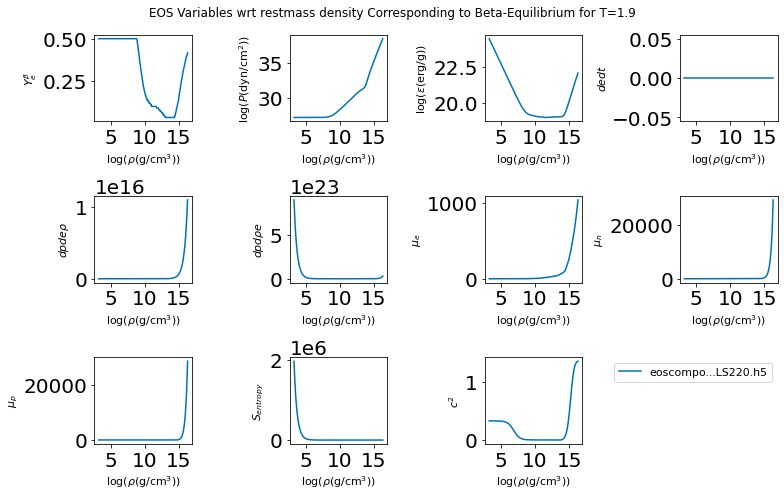

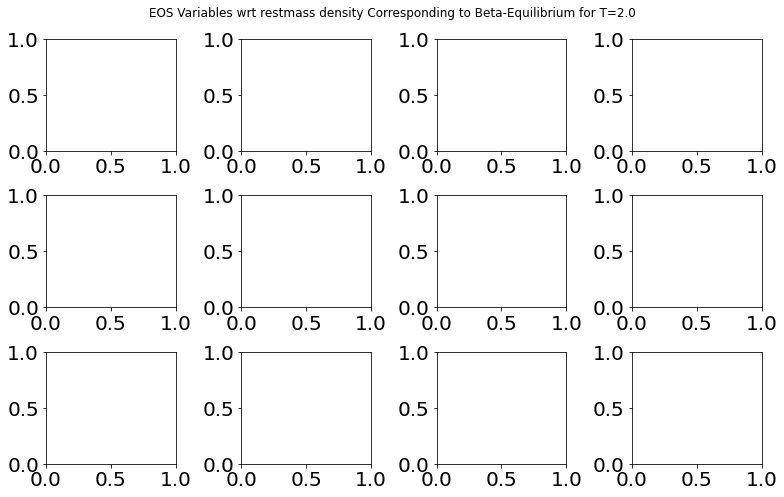

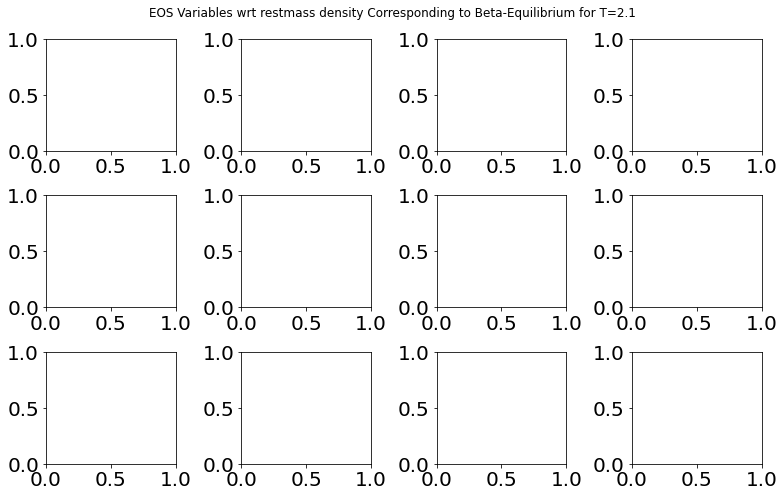

In [78]:
temp_range = np.linspace(0.2, 2.2, 20)
temp_range = np.arange(0.2,2.2,0.1)
print(temp_range)

#figs = [list(plot_EOS(['eoscompose_converted1_LS220.h5'],T=l)) for l in temp_range]
#print(figs)
#[i[0].show() for i in figs]

temp_range = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0, 2.1]

figs = []
for i,l in enumerate(temp_range):
    print(i,l)
    try:
        a,b,c,d,e = plot_EOS(['eoscompose_converted1_LS220.h5'],T=l)
        a.savefig(f'{l}_Beta.png')
        figs.append([a,b,c,d,e])
    except:
        continue
        
    
print(figs)
    

0: Abar
1: Xa
2: Xh
3: Xn
4: Xp
5: Zbar
6: cs2
7: dedt
8: dpderho
9: dpdrhoe
10: energy_shift
11: entropy
12: gamma
13: logenergy
14: logpress
15: logrho
16: logtemp
17: mu_e
18: mu_n
19: mu_p
20: muhat
21: munu
22: pointsrho
23: pointstemp
24: pointsye
25: ye
Temp Index:  23 
Tempurature:  0.302689039579154


/var/folders/nr/rbr3ndbn343d7__44zxt3v780000gn/T/ipykernel_41215/698818229.py:3: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig_2.show()


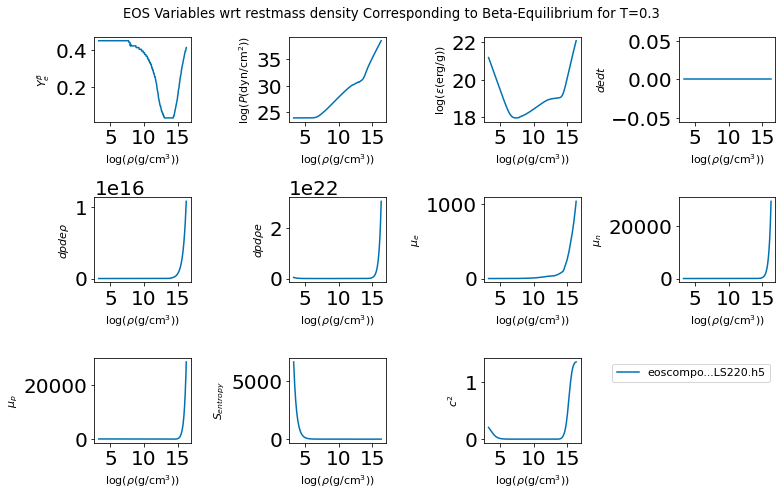

In [47]:
fig_2, logrho, dpderho_2, dpdrhoe_2 = plot_EOS(['eoscompose_converted1_LS220.h5'],T=0.3,verbose=True)

fig_2.show()

In [71]:
l = [i[0] for i in figs]

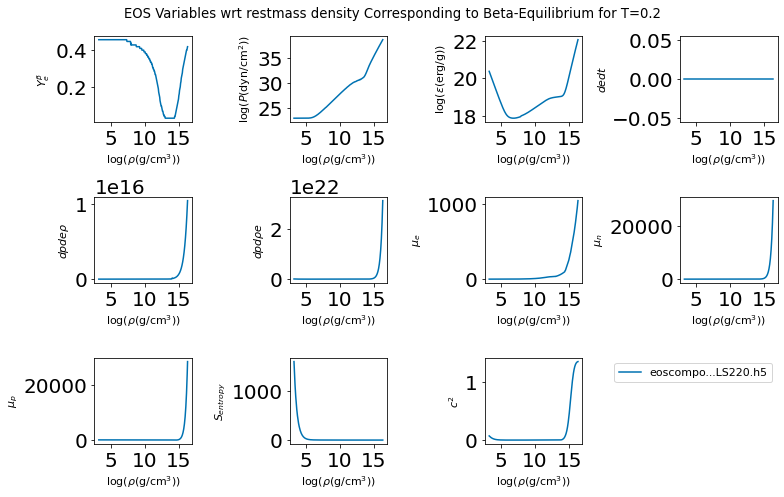

In [74]:
l[0]

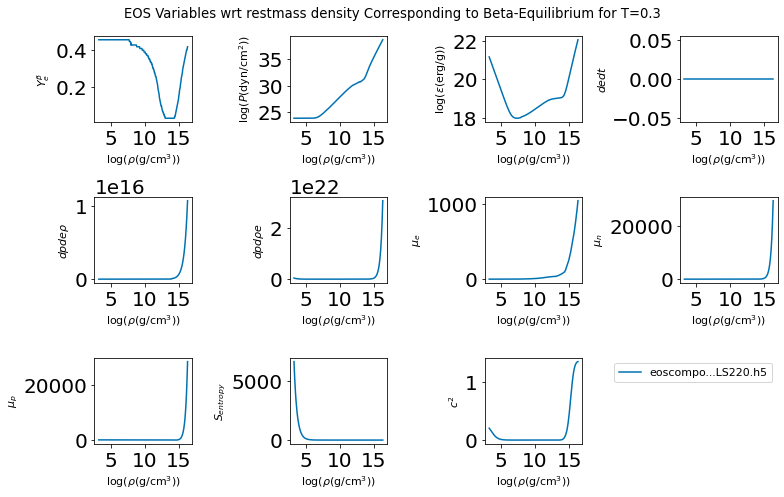

In [75]:
l[1]

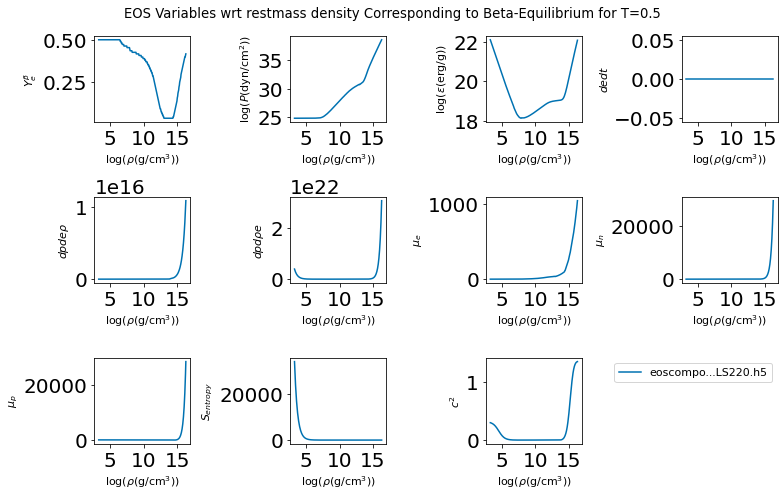

In [76]:
l[2]

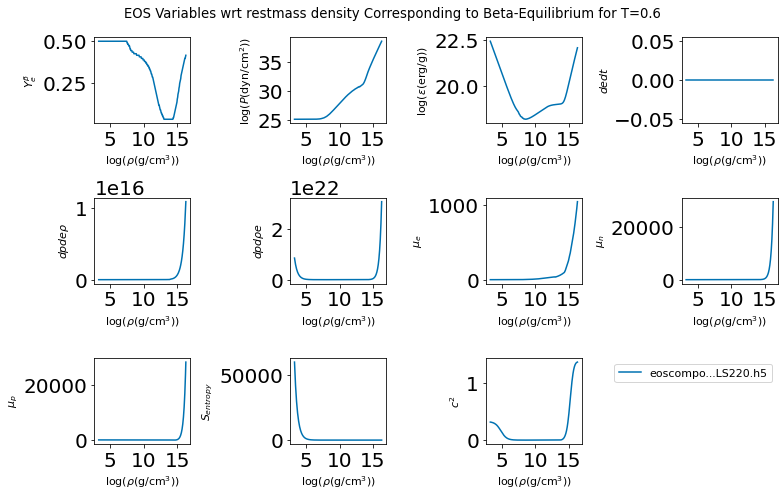

In [77]:
l[3]

[0.      0.00938 0.01876 0.02814 0.03752 0.0469  0.05628 0.06566 0.07504
 0.08442 0.0938  0.10318 0.11256 0.12194 0.13132 0.1407  0.15008 0.15946
 0.16884 0.17822 0.1876  0.19698 0.20636 0.21574 0.22512 0.2345  0.24388
 0.25326 0.26264 0.27202 0.2814  0.29078 0.30016 0.30954 0.31892 0.3283
 0.33768 0.34706 0.35644 0.36582 0.3752  0.38458 0.39396 0.40334 0.41272
 0.4221  0.43148 0.44086 0.45024 0.45962 0.469  ]
[0.0031  0.00628 0.01566 0.02504 0.03442 0.0438  0.05318 0.06256 0.07194
 0.08132 0.0907  0.10008 0.10946 0.11884 0.12822 0.1376  0.14698 0.15636
 0.16574 0.17512 0.1845  0.19388 0.20326 0.21264 0.22202 0.2314  0.24078
 0.25016 0.25954 0.26892 0.2783  0.28768 0.29706 0.30644 0.31582 0.3252
 0.33458 0.34396 0.35334 0.36272 0.3721  0.38148 0.39086 0.40024 0.40962
 0.419   0.42838 0.43776 0.44714 0.45652 0.4659 ]
[0.00651 0.00287 0.01225 0.02163 0.03101 0.04039 0.04977 0.05915 0.06853
 0.07791 0.08729 0.09667 0.10605 0.11543 0.12481 0.13419 0.14357 0.15295
 0.16233 0.17171 0.18109 0

[0.11144416 0.10206416 0.09268416 0.08330416 0.07392416 0.06454416
 0.05516416 0.04578416 0.03640416 0.02702416 0.01764416 0.00826416
 0.00111584 0.01049584 0.01987584 0.02925584 0.03863584 0.04801584
 0.05739584 0.06677584 0.07615584 0.08553584 0.09491584 0.10429584
 0.11367584 0.12305584 0.13243584 0.14181584 0.15119584 0.16057584
 0.16995584 0.17933584 0.18871584 0.19809584 0.20747584 0.21685584
 0.22623584 0.23561584 0.24499584 0.25437584 0.26375584 0.27313584
 0.28251584 0.29189584 0.30127584 0.31065584 0.32003584 0.32941584
 0.33879584 0.34817584 0.35755584]
[0.12568858 0.11630858 0.10692858 0.09754858 0.08816858 0.07878858
 0.06940858 0.06002858 0.05064858 0.04126858 0.03188858 0.02250858
 0.01312858 0.00374858 0.00563142 0.01501142 0.02439142 0.03377142
 0.04315142 0.05253142 0.06191142 0.07129142 0.08067142 0.09005142
 0.09943142 0.10881142 0.11819142 0.12757142 0.13695142 0.14633142
 0.15571142 0.16509142 0.17447142 0.18385142 0.19323142 0.20261142
 0.21199142 0.22137142 0.23

/var/folders/nr/rbr3ndbn343d7__44zxt3v780000gn/T/ipykernel_41215/18207072.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax= plt.subplots(nrows=3, ncols=4,figsize=(11,7), tight_layout=True)


[0.1775525 0.1681725 0.1587925 0.1494125 0.1400325 0.1306525 0.1212725
 0.1118925 0.1025125 0.0931325 0.0837525 0.0743725 0.0649925 0.0556125
 0.0462325 0.0368525 0.0274725 0.0180925 0.0087125 0.0006675 0.0100475
 0.0194275 0.0288075 0.0381875 0.0475675 0.0569475 0.0663275 0.0757075
 0.0850875 0.0944675 0.1038475 0.1132275 0.1226075 0.1319875 0.1413675
 0.1507475 0.1601275 0.1695075 0.1788875 0.1882675 0.1976475 0.2070275
 0.2164075 0.2257875 0.2351675 0.2445475 0.2539275 0.2633075 0.2726875
 0.2820675 0.2914475]
[0.19840775 0.18902775 0.17964775 0.17026775 0.16088775 0.15150775
 0.14212775 0.13274775 0.12336775 0.11398775 0.10460775 0.09522775
 0.08584775 0.07646775 0.06708775 0.05770775 0.04832775 0.03894775
 0.02956775 0.02018775 0.01080775 0.00142775 0.00795225 0.01733225
 0.02671225 0.03609225 0.04547225 0.05485225 0.06423225 0.07361225
 0.08299225 0.09237225 0.10175225 0.11113225 0.12051225 0.12989225
 0.13927225 0.14865225 0.15803225 0.16741225 0.17679225 0.18617225
 0.19555225 

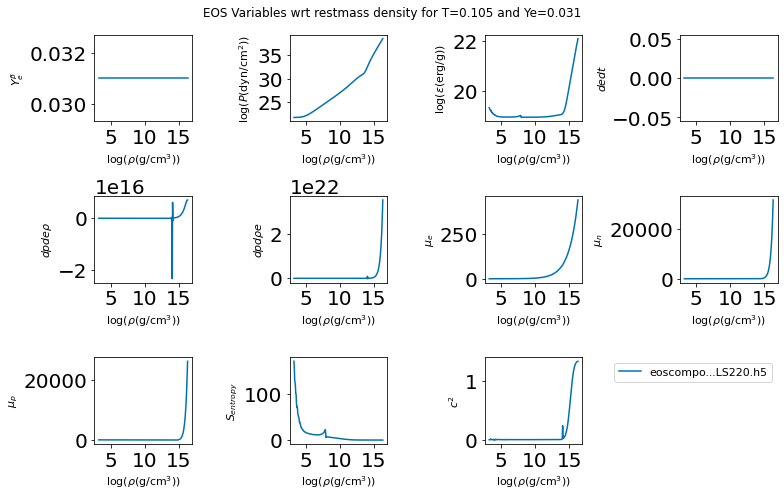

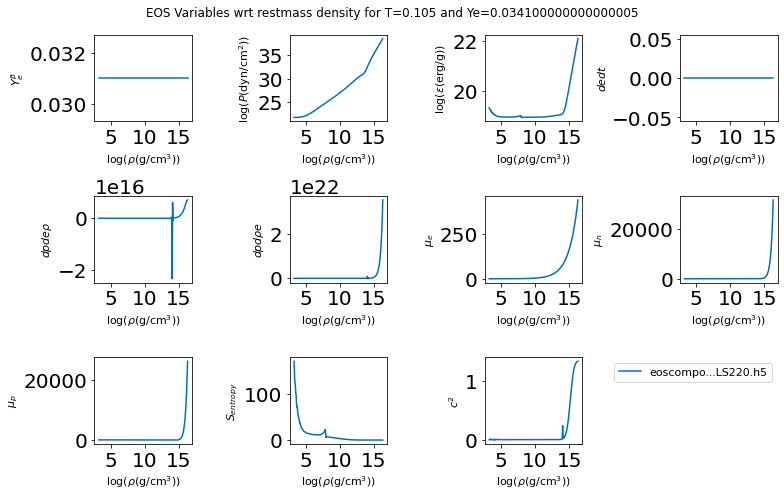

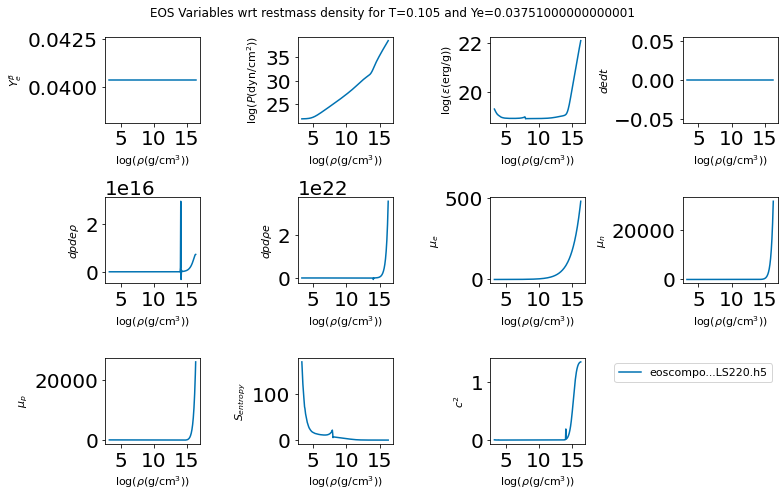

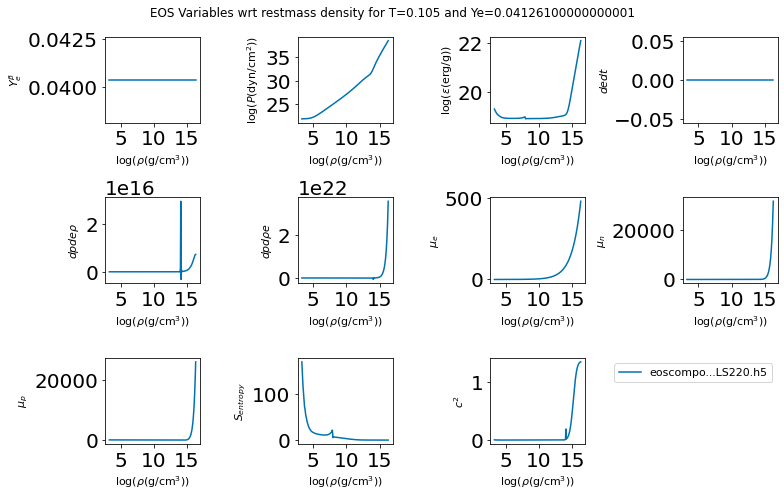

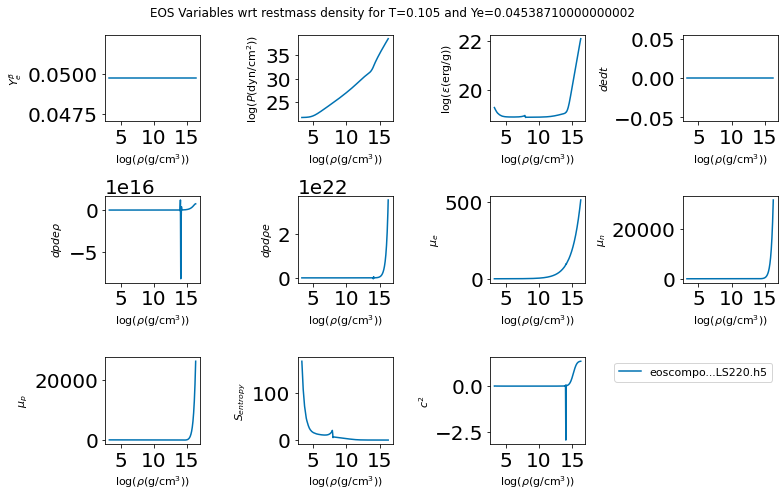

...

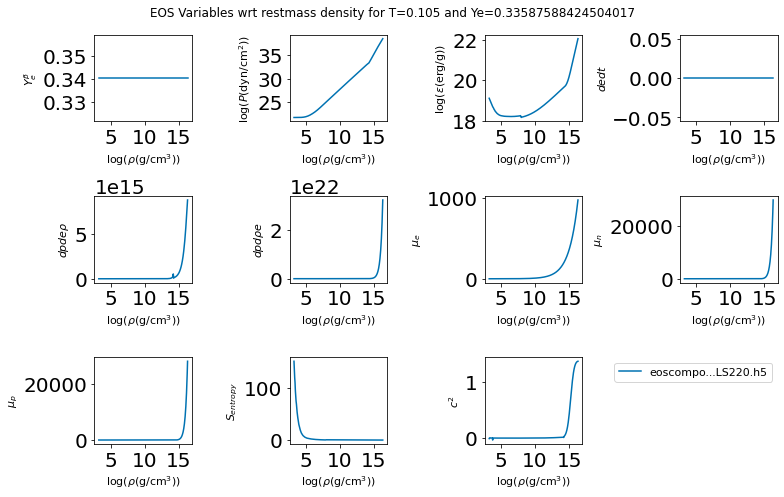

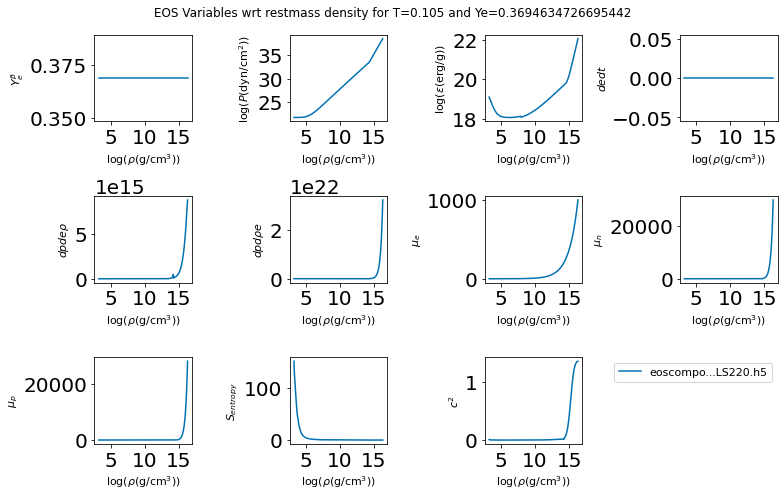

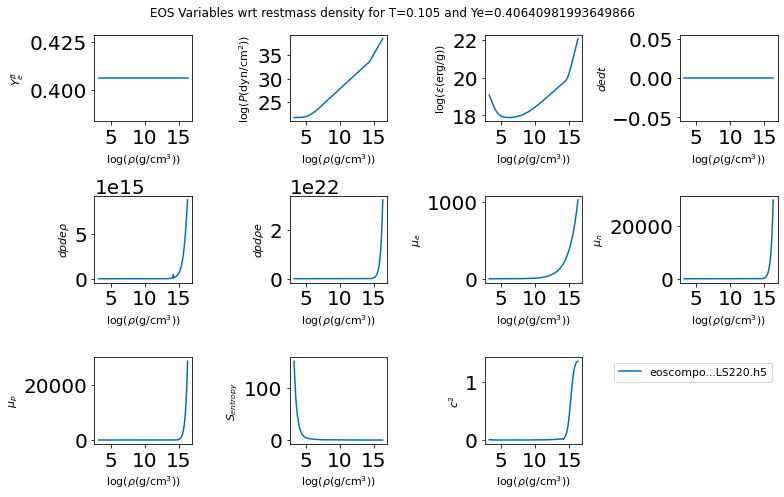

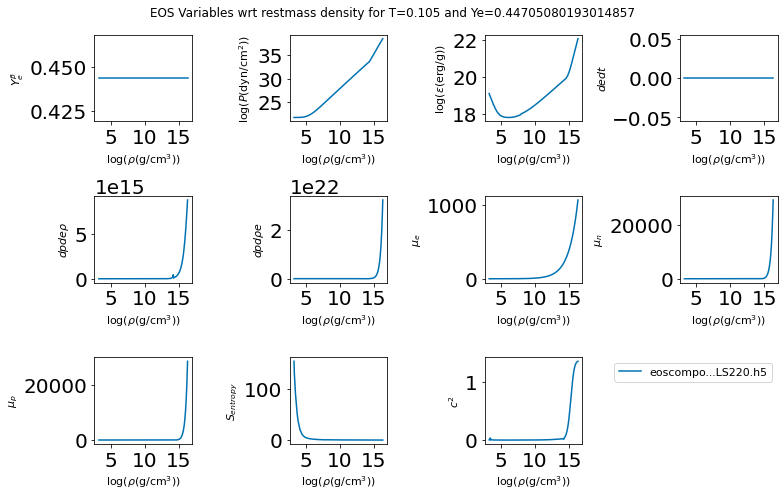

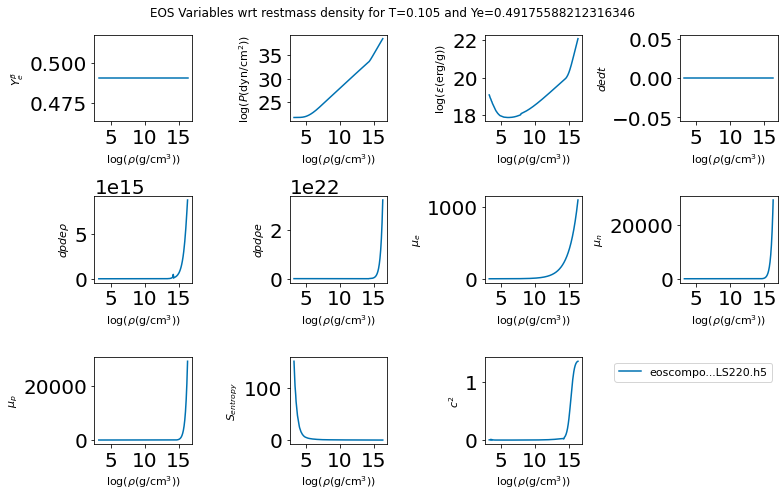

In [118]:
temp=0.105
ye=0.031

EOS_dict = {}

while ye<0.5:
    fig, logrho, dpderho, dpdrhoe, cs2 = plot_EOS(['eoscompose_converted1_LS220.h5'],ye=ye,T=temp,verbose=False)
    if  min(dpderho)<-0.1 or min(dpdrhoe)<-0.1:
        fig.savefig(str(ye)+' '+str(temp)+'.png')
        EOS_dict['ye: '+str(ye)] = [fig, logrho, dpderho, dpdrhoe, cs2]
    ye *= 1.1

In [119]:
EOS_dict.keys()

dict_keys(['ye: 0.031', 'ye: 0.034100000000000005', 'ye: 0.03751000000000001', 'ye: 0.04126100000000001', 'ye: 0.04538710000000002', 'ye: 0.04992581000000003', 'ye: 0.05491839100000004', 'ye: 0.060410230100000045', 'ye: 0.06645125311000005', 'ye: 0.07309637842100006', 'ye: 0.08040601626310007', 'ye: 0.08844661788941008', 'ye: 0.09729127967835109', 'ye: 0.10702040764618621', 'ye: 0.11772244841080484', 'ye: 0.12949469325188534', 'ye: 0.14244416257707387', 'ye: 0.15668857883478127', 'ye: 0.1723574367182594', 'ye: 0.18959318039008535', 'ye: 0.2085524984290939', 'ye: 0.2294077482720033', 'ye: 0.25234852309920364', 'ye: 0.27758337540912403', 'ye: 0.3053417129500365', 'ye: 0.33587588424504017', 'ye: 0.3694634726695442', 'ye: 0.40640981993649866', 'ye: 0.44705080193014857', 'ye: 0.49175588212316346'])

In [126]:
logrho = EOS_dict['ye: 0.031'][1]
dpderho = EOS_dict['ye: 0.031'][2]
dpderho_new = dpderho.copy()
neg_index=[dpderho.index(i)for i in dpderho if i<0]

print(neg_index)

[dpderho[i] for i in neg_index]


[0, 12, 14, 16, 17, 18, 25, 28, 33, 36, 37, 39, 40, 41, 42, 46, 62, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 208, 210, 211, 213]


[-301.2176316645473,
 -8281.14957929337,
 -2735.8753069221884,
 -32491.73382477819,
 -2714.553457613832,
 -7697.288993598972,
 -4381.69198816907,
 -7341.150323741394,
 -20459.764030994036,
 -275114.0881105339,
 -153630.52154376678,
 -440569.1313184376,
 -529799.3878680668,
 -177323.33923445,
 -74428.52476085609,
 -995686.0737912443,
 -9357126.768540882,
 -3835038.880718975,
 -1788838.6042565058,
 -2799139.779031303,
 -5190929.730463832,
 -5052420.758096259,
 -3755382.329830027,
 -3568800.3284278386,
 -3375273.5402604444,
 -3091974.363082826,
 -2638820.2925088005,
 -2895371.0896391217,
 -2761130.2421942954,
 -2626916.9703717376,
 -2907360.4597279453,
 -2896861.3873980446,
 -2657933.0172996325,
 -2341204.825193478,
 -2141228.8720965856,
 -2070972.7433397549,
 -2064274.5910580554,
 -2078570.0362318049,
 -2126677.5997057576,
 -2137998.962939757,
 -2091845.1818107879,
 -2065864.3600670039,
 -2059582.4190878689,
 -1862931.4947992216,
 -4038800.863862801,
 -10002917253454.14,
 -27728669995229

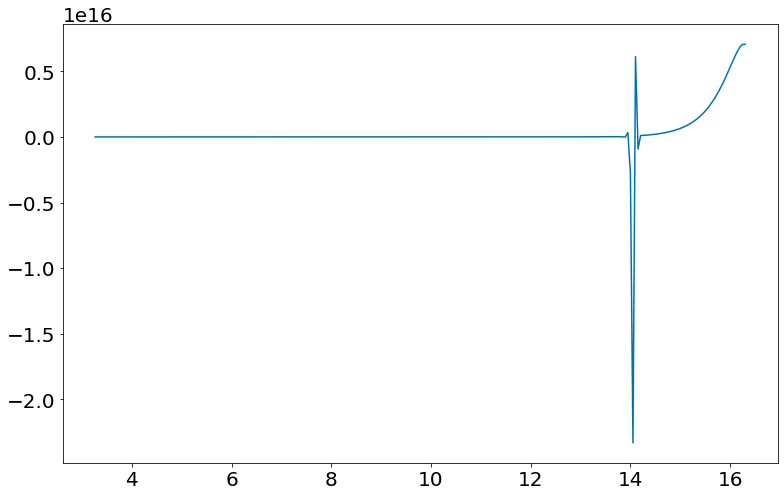

In [123]:
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(11,7), tight_layout=True)
ax.plot(logrho, dpderho)

In [184]:
dpderho_slice = dpderho_new[64:91]

cumsum_vec = np.cumsum(np.insert(dpderho_slice, 0, 0)) 
ma_vec = (cumsum_vec[6:] - cumsum_vec[:-6]) / 6


print(len(dpderho_new), len(ma_vec), len(logrho))
print(dpderho_new[65:87])
dpderho_new[65:87] = ma_vec
print(dpderho_new[65:87])
len(dpderho_new[65:87])
len(dpderho_new)

dpderho_new1 = dpderho.copy()
#print(dpderho_new1)

neg_replacements = [np.random.uniform(0.00001, 0.05) for i in neg_index] #.sort()
neg_replacements.sort()

print(neg_replacements)

for i,l in enumerate(neg_index):
    
    dpderho_new1[l] = neg_replacements[i]
    
    
    

256 22 256
[-2433212.7677066517, -2137006.5784468246, -2074414.3897080915, -2061186.2594947873, -2058396.3498651832, -2057800.253834679, -2057664.0523891596, -2057642.9493525475, -2057679.210265734, -2057612.8167890199, -2057581.2914048086, -2057675.0527085525, -2057882.5255261299, -2057245.1568987481, -2057490.4070296492, -2058175.595109536, -2058826.2529882106, -2053850.913447241, -2059354.0676707316, -2061356.3084858905, -2061394.3669191524, -2028323.5645773534]
[-2433209.204323419, -2137002.7665093695, -2074411.3139564537, -2061184.042440741, -2058394.8458670147, -2057799.2720827202, -2057663.4290059914, -2057642.5621516367, -2057678.9743411317, -2057612.6755988318, -2057581.2083928175, -2057675.0047795705, -2057882.4983768042, -2057245.141833252, -2057490.3988573526, -2058175.5907885425, -2058826.2507701267, -2053850.9123480965, -2059354.0671518594, -2061356.3082551535, -2061394.3668246765, -2028323.564543565]
[0.0007566939517246516, 0.0009849035152346324, 0.0021892148426659987, 0

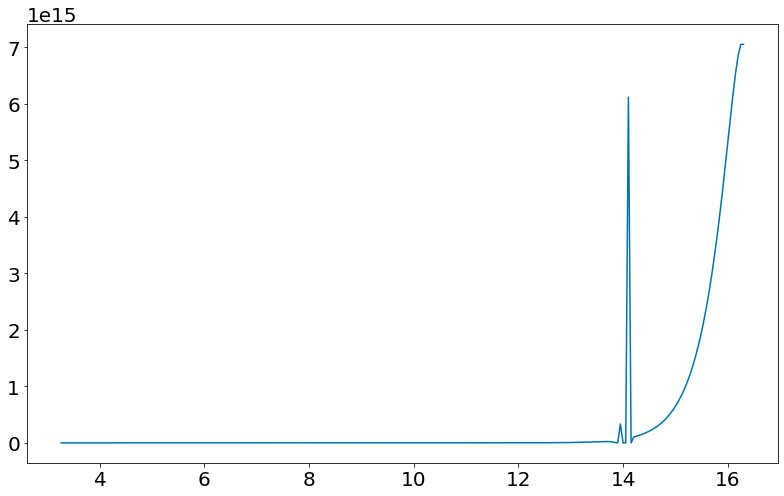

In [185]:
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(11,7), tight_layout=True)
ax.plot(logrho, dpderho_new1)

In [187]:
slope = []
for i, j in enumerate(dpderho_new1):
    if i == len(dpderho_new1)-1:
        break      
    else: slope.append(np.abs(dpderho_new1[i+1]-j))

print(max(slope), slope.index(max(slope)))

6119137587287735.0 211


In [196]:
maxim = max(slope) 
max_ind = slope.index(max(slope))
peak_indices = range(max_ind-6, max_ind+6)
for i in peak_indices:
    dpderho_new1[i] = (dpderho_new1[i-7]+dpderho_new1[i+7])/2


                                          

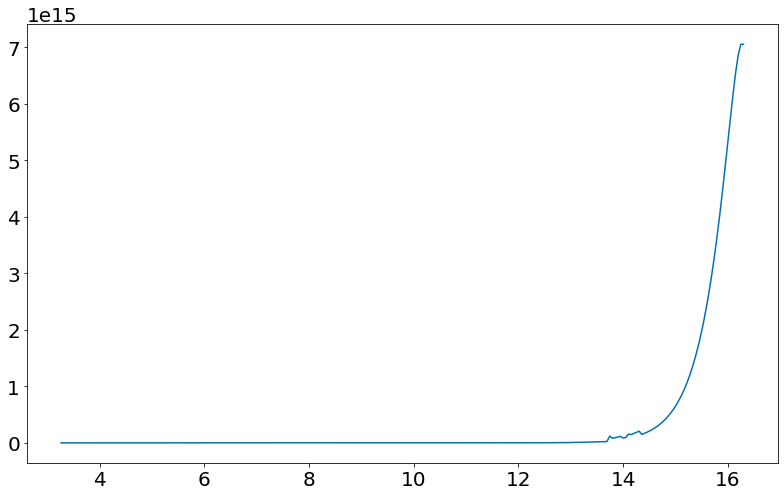

In [197]:
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(11,7), tight_layout=True)
ax.plot(logrho, dpderho_new1)

In [58]:
def convolve(eos_var_list, num_times=3):
    for i in range(num_times):
        slope = []
        for i, j in enumerate(eos_var_list):
            if i == len(eos_var_list)-1:
                break      
            else: slope.append(np.abs(eos_var_list[i+1]-j))
            
    
        maxim = max(slope) 
        max_ind = slope.index(max(slope))
        print('max slope:', maxim, '\nmax slope index:', max_ind)
        
        if maxim > sum(slope)/len(slope)*3:
            try:
                max_value = eos_var_list[max_ind+7]
                peak_indices = range(max_ind-6, max_ind+6)
                for i in peak_indices:
                    ave_min = eos_var_list[i-7]
                    ave_max = eos_var_list[i+7]
                    eos_var_list[i] = (ave_min+ave_max)/2
            except IndexError as msg:
                print(msg)
                break
            
def replace_neg(eos_var_list, eos_var):
    neg_index=[eos_var_list.index(i)for i in eos_var_list if i<0]
    print(f'{eos_var} neg indices:', neg_index)
    print(f'{eos_var} neg values:', [eos_var_list[i] for i in neg_index])
    max_val = min(np.abs([eos_var_list[i] for i in neg_index]))
    neg_replacements = [np.random.uniform(max_val/2, max_val/5) for i in neg_index]
            
    neg_replacements.sort()

    print('neg_replacements:', neg_replacements)

    for i,l in enumerate(neg_index):
        eos_var_list[l] = neg_replacements[i]



def augmentEOS(filename, fig_folder, augmented_filename=None, pos_cs2=True, verbose=False):
    f = h5py.File(filename, 'r')

    keys = list(f.keys())
    possible_varnames=['Abar','Xa','Xh','Xn','Xp','Zbar','cs2','dedt','dpderho','dpdrhoe','energy_shift','entropy',
                    'gamma','logenergy','logpress','logrho','logtemp','mu_e','mu_n','mu_p','muhat','munu',
                   'pointsrho','pointstemp','pointsye','ye']

       
        
    CO_EOS=[]
    for i in range(0, len(keys)):
        if verbose:
            print("%d: %s" %(i, keys[i]))
        CO_EOS.append(np.array(f.get(keys[i])))
        
    #Get the minimum temperature
    T_target = min(CO_EOS[keys.index('logtemp')])
    T_index = list(CO_EOS[keys.index('logtemp')]).index(T_target)
    
        
    Ye_target_list = list(CO_EOS[keys.index('ye')])
    # Ye_target = min(Ye_target_list)
    
    for Ye_target in Ye_target_list:
        Ye_index = Ye_target_list.index(Ye_target)

        if verbose:
            print('Temp Index: ',T_index, '\nTempurature: ', 10.**T_target)
            print('Ye Index: ',Ye_index, '\nYe: ', Ye_target)

        # ye_all = CO_EOS[keys2.index('ye')]
        logRho_CO=[]
        Yebeta_CO=[]
        logPressbeta_CO=[]
        logEnergybeta_CO=[]
        dedt_CO=[]
        dpderho_CO=[]
        dpdrhoe_CO=[]
        mu_e_CO=[]
        mu_n_CO=[]
        mu_p_CO=[]
        entropy_CO=[]
        cs2_CO=[]


        for rho_index in range(0, len(CO_EOS[keys.index('logrho')])):

        #keep the current value of rho, the value of Ye that corresponds to beta-equilibrium,
        #and the Pressure at this rho and Ye (temperature has been fixed to 0.1 MeV)
        #do the same for the energy density
            logRho_CO.append(CO_EOS[keys.index('logrho')][rho_index])
            Yebeta_CO.append(CO_EOS[keys.index('ye')][Ye_index])
            logPressbeta_CO.append(CO_EOS[keys.index('logpress')][Ye_index][T_index][rho_index])
            logEnergybeta_CO.append(CO_EOS[keys.index('logenergy')][Ye_index][T_index][rho_index])
            dedt_CO.append(CO_EOS[keys.index('dedt')][Ye_index][T_index][rho_index])
            dpderho_CO.append(CO_EOS[keys.index('dpderho')][Ye_index][T_index][rho_index])
            dpdrhoe_CO.append(CO_EOS[keys.index('dpdrhoe')][Ye_index][T_index][rho_index])
            mu_e_CO.append(CO_EOS[keys.index('mu_e')][Ye_index][T_index][rho_index])
            mu_n_CO.append(CO_EOS[keys.index('mu_n')][Ye_index][T_index][rho_index])
            mu_p_CO.append(CO_EOS[keys.index('mu_p')][Ye_index][T_index][rho_index])
            entropy_CO.append(CO_EOS[keys.index('entropy')][Ye_index][T_index][rho_index])
            cs2_CO.append(CO_EOS[keys.index('cs2')][Ye_index][T_index][rho_index])

        if pos_cs2:
            replace_neg(cs2_CO, 'cs2')
            
            '''
            neg_index=[cs2_CO.index(i)for i in cs2_CO if i<0]
            print('cs2 neg indices:', neg_index)
            print('cs2 neg values:', [cs2_CO[i] for i in neg_index])
            neg_replacements = [np.random.uniform(0.0000001, 0.000005) for i in neg_index]
            neg_replacements.sort()

            print('neg_replacements:', neg_replacements)

            for i,l in enumerate(neg_index):
                cs2_CO[l] = neg_replacements[i]
            '''
                
                
        print('dpderho')    
        convolve(dpderho_CO)
        print('dpdrhoe')
        convolve(dpdrhoe_CO)
        print('cs2')
        convolve(cs2_CO)
        #print('entropy')
        #convolve(entropy_CO)

        plt.style.use('seaborn-colorblind')

        fig, ax= plt.subplots(nrows=3, ncols=4,figsize=(11,7), tight_layout=True)
        #define the subplot for this figure, we are only doing one subplot for now
        #set the value of the line width and font size
        universal_linewidth=2
        universal_fontsize=11

        fig.suptitle(f"EOS Variables wrt restmass density for T={10**T_target} and Ye={Ye_target}")

        ax[0][0].plot(logRho_CO, Yebeta_CO)
        ax[0][1].plot(logRho_CO, logPressbeta_CO)
        ax[0][2].plot(logRho_CO, logEnergybeta_CO)
        ax[0][3].plot(logRho_CO, dedt_CO)
        ax[1][0].plot(logRho_CO, dpderho_CO)
        ax[1][1].plot(logRho_CO, dpdrhoe_CO)
        ax[1][2].plot(logRho_CO, mu_e_CO)
        ax[1][3].plot(logRho_CO, mu_n_CO)
        ax[2][0].plot(logRho_CO, mu_p_CO)
        ax[2][1].plot(logRho_CO, entropy_CO)
        ax[2][2].plot(logRho_CO, cs2_CO,label=shorten_path(filename,20))

        ax[0][0].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
        ax[0][0].set_ylabel(r'$Y_{e}^\beta$', fontsize=universal_fontsize)
        ax[0][1].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
        ax[0][1].set_ylabel(r'$\log(P \rm{ (dyn/cm^2)})$', fontsize=universal_fontsize)
        ax[0][2].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
        ax[0][2].set_ylabel(r'$\log(\epsilon \rm{ (erg/g)})$', fontsize=universal_fontsize)
        ax[0][3].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
        ax[0][3].set_ylabel(r'$dedt$', fontsize=universal_fontsize)
        ax[1][0].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
        ax[1][0].set_ylabel(r'$dpde\rho$', fontsize=universal_fontsize)
        ax[1][1].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
        ax[1][1].set_ylabel(r'$dpd\rho e$', fontsize=universal_fontsize)
        ax[1][2].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
        ax[1][2].set_ylabel(r'$\mu_e$', fontsize=universal_fontsize)
        ax[1][3].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
        ax[1][3].set_ylabel(r'$\mu_n$', fontsize=universal_fontsize)
        ax[2][0].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
        ax[2][0].set_ylabel(r'$\mu_p$', fontsize=universal_fontsize)
        ax[2][1].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
        ax[2][1].set_ylabel(r'$S_{entropy}$', fontsize=universal_fontsize)
        ax[2][2].set_xlabel(r'$\log(\rho \rm{ (g/cm^3)})$', fontsize=universal_fontsize)
        ax[2][2].set_ylabel(r'$c^2$', fontsize=universal_fontsize)
        ax[2][3].axis('off')

        handles, labels = ax[2][2].get_legend_handles_labels()

        ax[2][3].legend(handles, labels, prop=dict(size=universal_fontsize))
        
        fig.savefig('LS_220_graphs/'+fig_folder+f'/{Ye_target}.png')

        for rho_index in range(0, len(CO_EOS[keys.index('logrho')])):
            CO_EOS[keys.index('dpderho')][Ye_index][T_index][rho_index] = dpderho_CO[rho_index]
            CO_EOS[keys.index('dpdrhoe')][Ye_index][T_index][rho_index] = dpdrhoe_CO[rho_index]
            CO_EOS[keys.index('cs2')][Ye_index][T_index][rho_index] = cs2_CO[rho_index]


0: Abar
1: Xa
2: Xh
3: Xn
4: Xp
5: Zbar
6: cs2
7: dedt
8: dpderho
9: dpdrhoe
10: energy_shift
11: entropy
12: gamma
13: logenergy
14: logpress
15: logrho
16: logtemp
17: mu_e
18: mu_n
19: mu_p
20: muhat
21: munu
22: pointsrho
23: pointstemp
24: pointsye
25: ye
Temp Index:  0 
Tempurature:  0.105
Ye Index:  0 
Ye:  0.031
Temp Index:  0 
Tempurature:  0.105
Ye Index:  1 
Ye:  0.04038
Temp Index:  0 
Tempurature:  0.105
Ye Index:  2 
Ye:  0.04976
Temp Index:  0 
Tempurature:  0.105
Ye Index:  3 
Ye:  0.05914
Temp Index:  0 
Tempurature:  0.105
Ye Index:  4 
Ye:  0.06852
Temp Index:  0 
Tempurature:  0.105
Ye Index:  5 
Ye:  0.0779
Temp Index:  0 
Tempurature:  0.105
Ye Index:  6 
Ye:  0.08728
Temp Index:  0 
Tempurature:  0.105
Ye Index:  7 
Ye:  0.09666
Temp Index:  0 
Tempurature:  0.105
Ye Index:  8 
Ye:  0.10604
Temp Index:  0 
Tempurature:  0.105
Ye Index:  9 
Ye:  0.11542
Temp Index:  0 
Tempurature:  0.105
Ye Index:  10 
Ye:  0.1248
Temp Index:  0 
Tempurature:  0.105
Ye Index:  11

/var/folders/nr/rbr3ndbn343d7__44zxt3v780000gn/T/ipykernel_73686/1335640900.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax= plt.subplots(nrows=3, ncols=4,figsize=(11,7), tight_layout=True)


Temp Index:  0 
Tempurature:  0.105
Ye Index:  21 
Ye:  0.22798
Temp Index:  0 
Tempurature:  0.105
Ye Index:  22 
Ye:  0.23736
Temp Index:  0 
Tempurature:  0.105
Ye Index:  23 
Ye:  0.24674
Temp Index:  0 
Tempurature:  0.105
Ye Index:  24 
Ye:  0.25612
Temp Index:  0 
Tempurature:  0.105
Ye Index:  25 
Ye:  0.26549999999999996
Temp Index:  0 
Tempurature:  0.105
Ye Index:  26 
Ye:  0.27488
Temp Index:  0 
Tempurature:  0.105
Ye Index:  27 
Ye:  0.28425999999999996
Temp Index:  0 
Tempurature:  0.105
Ye Index:  28 
Ye:  0.29364
Temp Index:  0 
Tempurature:  0.105
Ye Index:  29 
Ye:  0.30301999999999996
Temp Index:  0 
Tempurature:  0.105
Ye Index:  30 
Ye:  0.3124
Temp Index:  0 
Tempurature:  0.105
Ye Index:  31 
Ye:  0.32177999999999995
Temp Index:  0 
Tempurature:  0.105
Ye Index:  32 
Ye:  0.33116
Temp Index:  0 
Tempurature:  0.105
Ye Index:  33 
Ye:  0.34053999999999995
Temp Index:  0 
Tempurature:  0.105
Ye Index:  34 
Ye:  0.34992
Temp Index:  0 
Tempurature:  0.105
Ye Index:

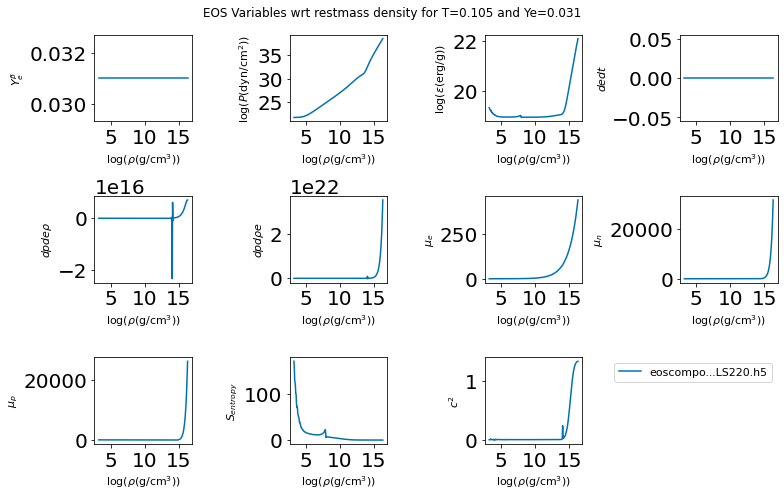

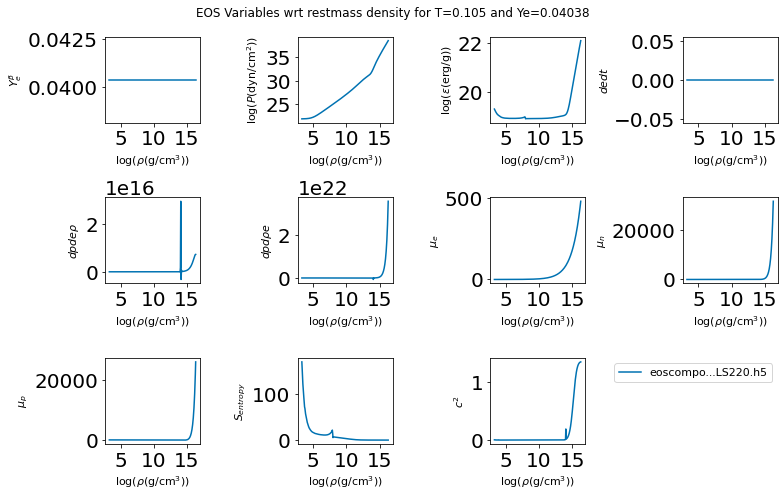

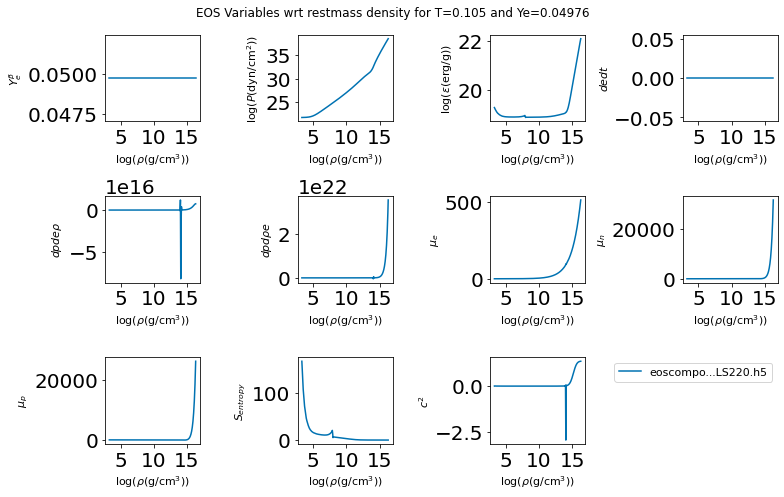

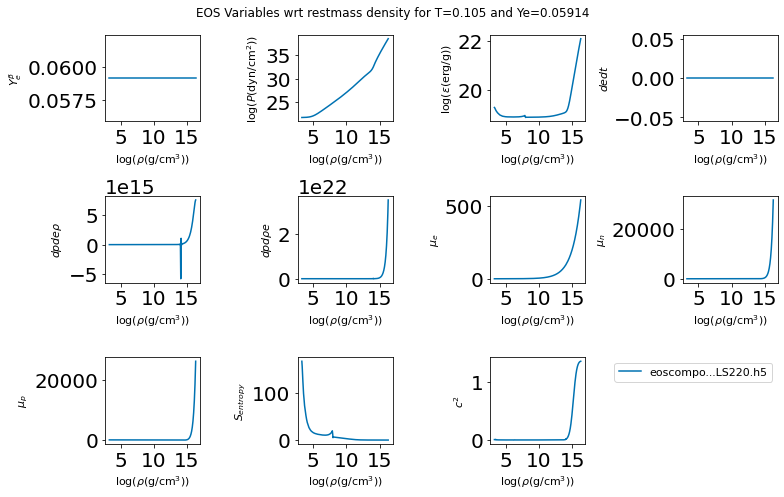

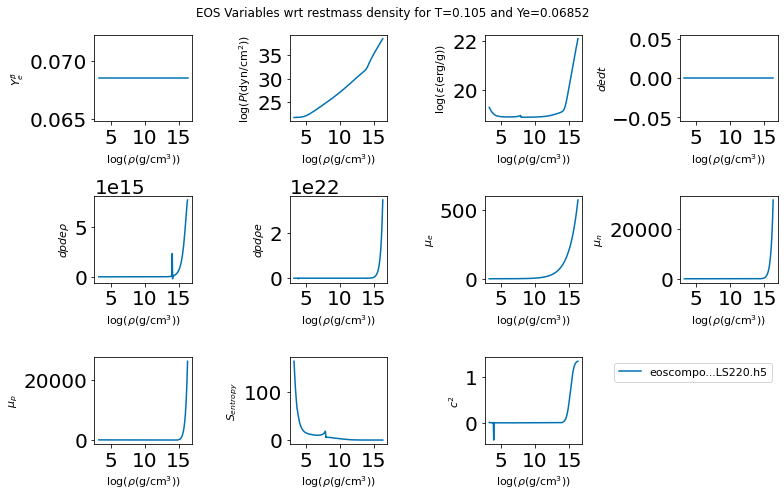

...

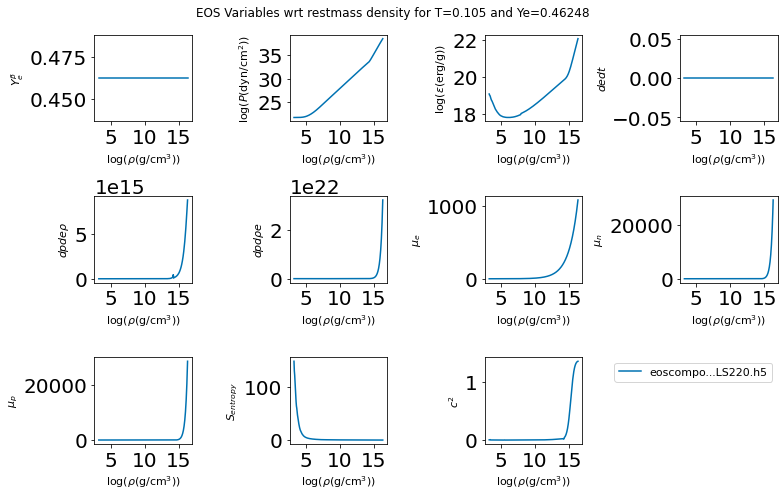

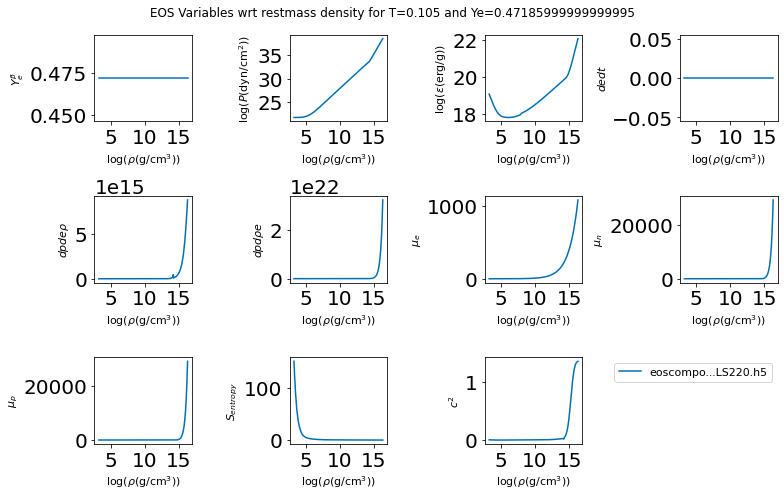

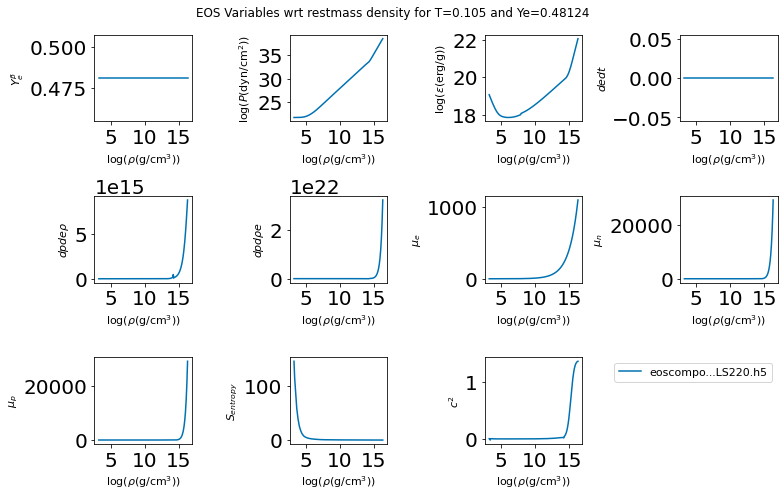

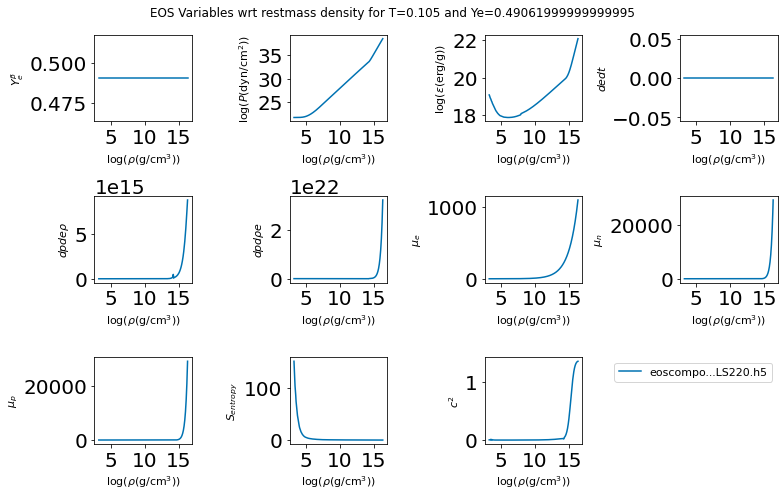

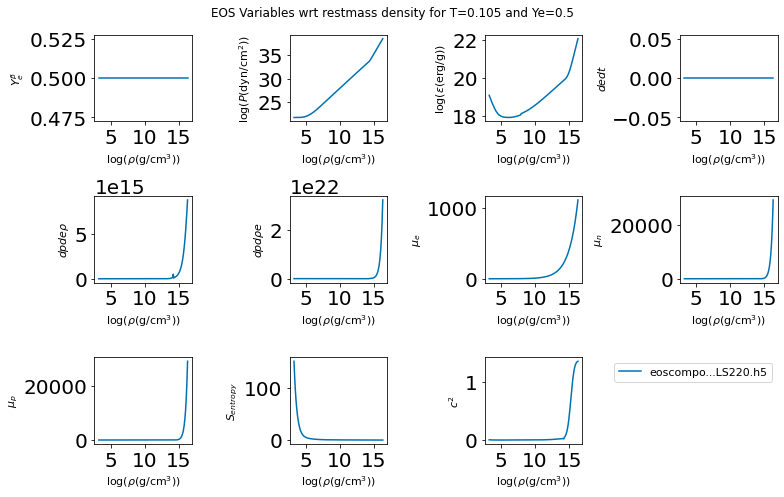

In [52]:
augmentEOS('eoscompose_converted1_LS220.h5', fig_folder='untouched_t_105', pos_cs2=False, verbose=True)

0: Abar
1: Xa
2: Xh
3: Xn
4: Xp
5: Zbar
6: cs2
7: dedt
8: dpderho
9: dpdrhoe
10: energy_shift
11: entropy
12: gamma
13: logenergy
14: logpress
15: logrho
16: logtemp
17: mu_e
18: mu_n
19: mu_p
20: muhat
21: munu
22: pointsrho
23: pointstemp
24: pointsye
25: ye
Temp Index:  0 
Tempurature:  0.105
Ye Index:  0 
Ye:  0.031
cs2 neg indices: [0, 12, 14, 16, 17, 18, 25, 28, 36, 37, 39, 40, 41, 46, 62, 64, 67]
cs2 neg values: [-0.0026388022992933006, -0.004487571446665391, -0.0008527349349532538, -0.00703185712374363, -0.00037207596134020767, -0.0009655273398640531, -2.3355898119088162e-05, -4.062417287323412e-06, -0.0006378621524934402, -0.00023563432295420383, -0.0005423246322669572, -0.0005377075326948328, -7.376316692490702e-05, -0.0003080312066652072, -0.00029771227741560204, -2.1520111977351606e-05, -1.0459644240297719e-05]
neg_replacements: [8.266193732020247e-07, 8.389023120049347e-07, 9.13250864597412e-07, 9.211394393675151e-07, 9.563239982999704e-07, 1.0038096255846017e-06, 1.033852

Temp Index:  0 
Tempurature:  0.105
Ye Index:  10 
Ye:  0.1248
cs2 neg indices: [33, 69, 70, 91]
cs2 neg values: [-0.007822438205220937, -8.15507697542447e-05, -1.789529778731855e-05, -5.2374726421025786e-05]
neg_replacements: [4.882158634041938e-06, 5.8452376147406454e-06, 8.43452841170882e-06, 8.7669368251092e-06]
dpderho
max slope: 520118857159947.0 
max slope index: 251
list index out of range
dpdrhoe
max slope: 5.469039717118399e+21 
max slope index: 254
list index out of range
cs2
max slope: 0.0671675909165158 
max slope index: 233
max slope: 0.14727440227098265 
max slope index: 226
max slope: 0.14300415340981867 
max slope index: 219
Temp Index:  0 
Tempurature:  0.105
Ye Index:  11 
Ye:  0.13418
cs2 neg indices: [33, 59, 69, 70, 71, 91]
cs2 neg values: [-0.0028524206334741894, -0.00031092851035673574, -0.0006900287700380561, -7.243388237349261e-05, -1.7612619241185496e-05, -6.234860679001876e-05]
neg_replacements: [4.599838162954039e-06, 5.317238383610632e-06, 7.61334822278069

/var/folders/nr/rbr3ndbn343d7__44zxt3v780000gn/T/ipykernel_73686/3021590820.py:134: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax= plt.subplots(nrows=3, ncols=4,figsize=(11,7), tight_layout=True)


Temp Index:  0 
Tempurature:  0.105
Ye Index:  21 
Ye:  0.22798
cs2 neg indices: [37, 49, 50, 68, 76, 77, 81, 84, 91]
cs2 neg values: [-0.00018217346587967852, -0.0003038864373947516, -0.00016781788265166157, -6.9759087645758075e-06, -0.00038544557064476456, -4.955208015185376e-06, -5.4176150952674213e-05, -0.00030553854254889085, -0.00015707463466010823]
neg_replacements: [1.0319465757032164e-06, 1.3143810949722434e-06, 1.3469522500087697e-06, 1.671630860654645e-06, 1.6814306885465015e-06, 1.8679511350079757e-06, 2.1190208214335576e-06, 2.2970135216678114e-06, 2.338713922193891e-06]
dpderho
max slope: 584124008204358.0 
max slope index: 252
list index out of range
dpdrhoe
max slope: 5.247391324532027e+21 
max slope index: 254
list index out of range
cs2
max slope: 0.06829799682063875 
max slope index: 233
max slope: 0.15055053858519227 
max slope index: 226
max slope: 0.13665397940206325 
max slope index: 219
Temp Index:  0 
Tempurature:  0.105
Ye Index:  22 
Ye:  0.23736
cs2 neg indi

ValueError: min() arg is an empty sequence

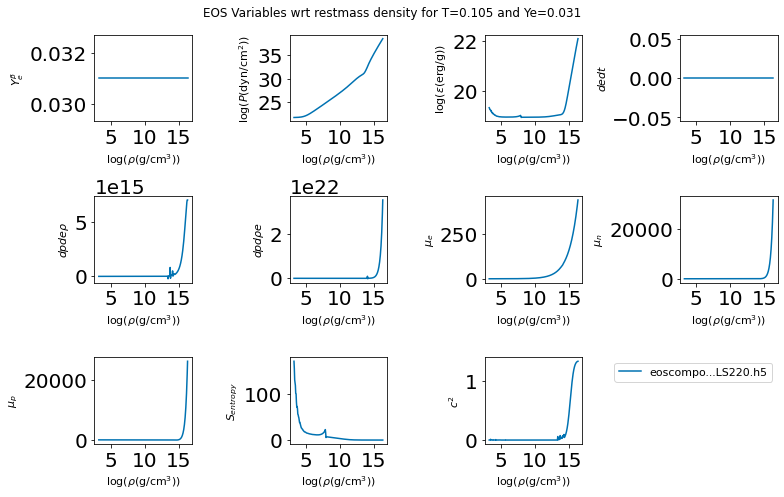

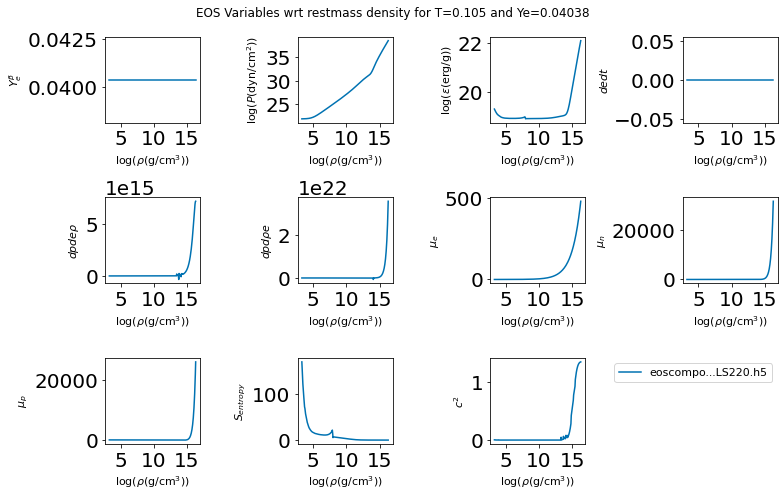

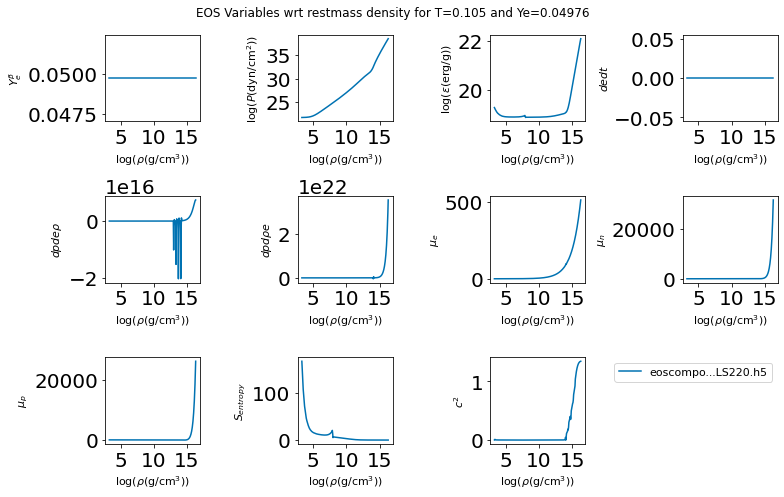

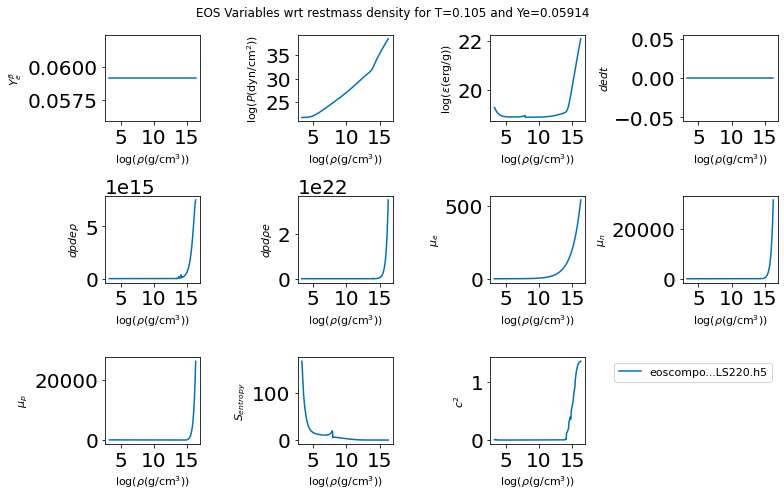

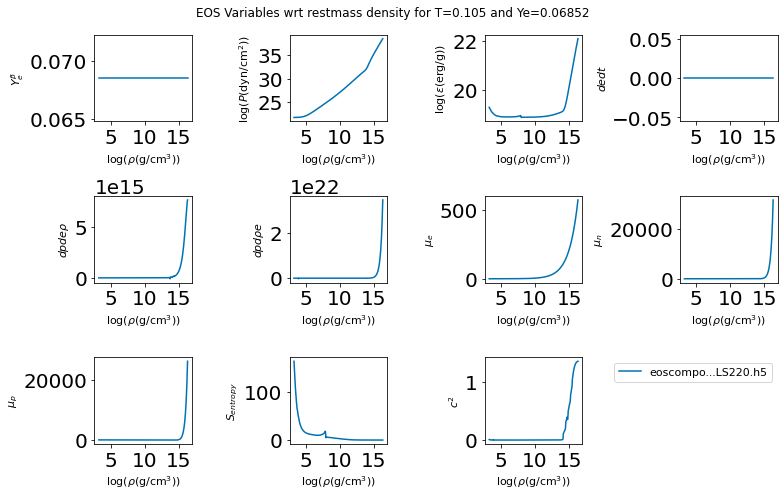

...

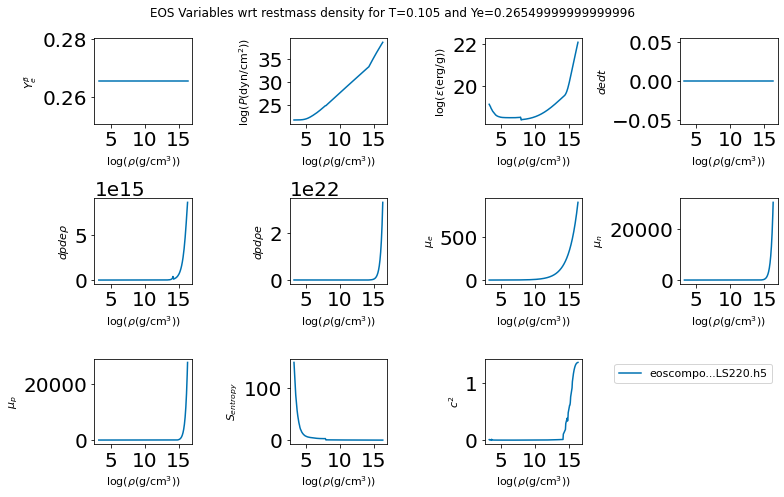

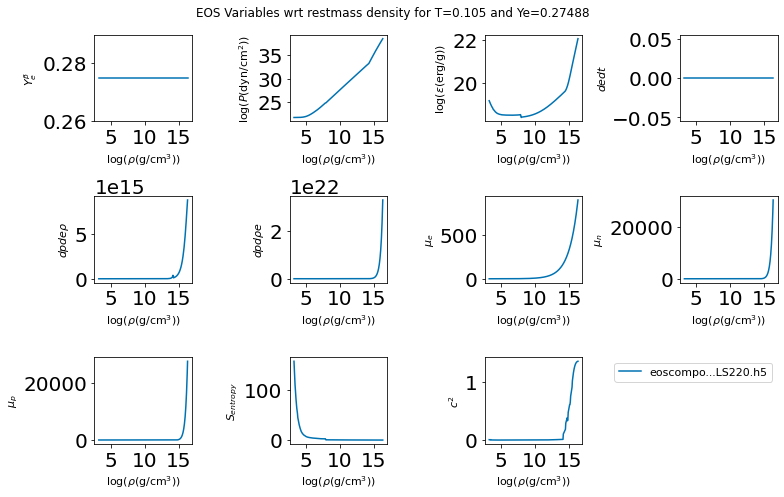

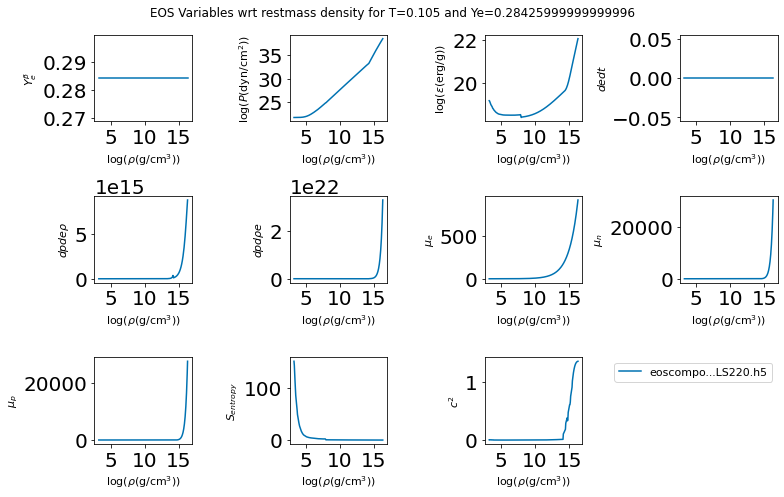

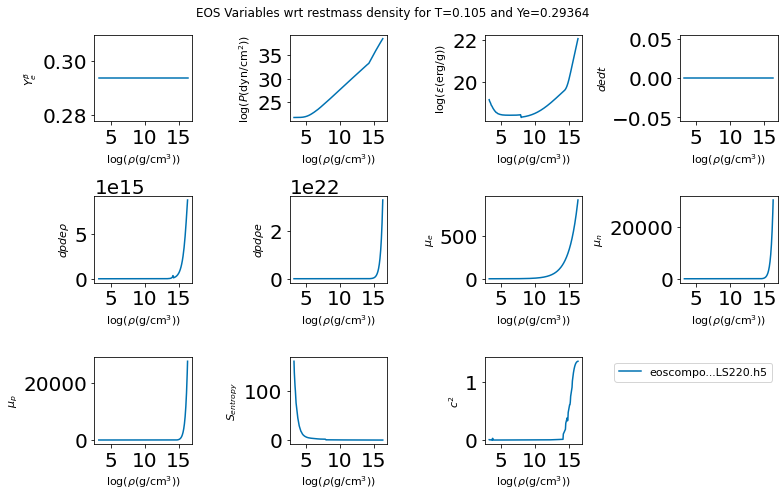

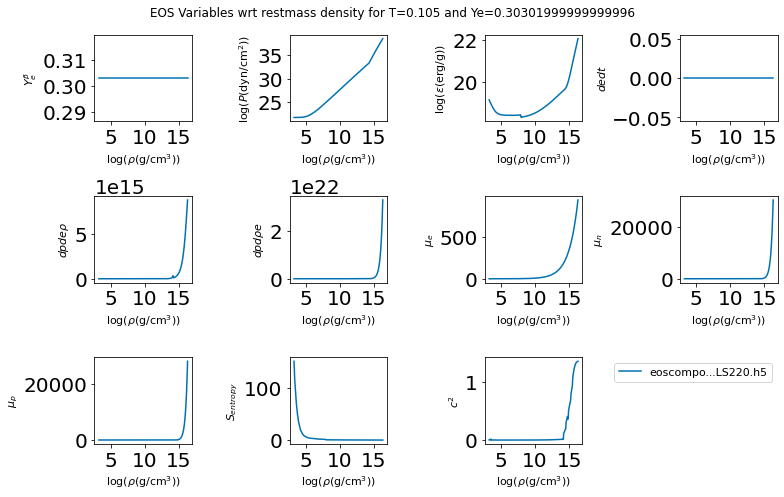

In [59]:
augmentEOS('eoscompose_converted1_LS220.h5',fig_folder='morethnAVE_pos_func_cs2_t_105', verbose=True)